In [4]:
import os
import numpy as np
import pickle
from statsmodels.stats.multitest import fdrcorrection
import scipy.stats as stats
import scipy.io as sio
import matplotlib.pyplot as plt
from nilearn.image import new_img_like
import pandas as pd
import nibabel as nib
import csv
from nilearn import plotting
# from rsatoolbox.inference import eval_fixed
# from rsatoolbox.model import ModelFixed
from glob import glob
import nilearn.image as nlimg
from rsatoolbox.util.searchlight import get_volume_searchlight, get_searchlight_RDMs, evaluate_models_searchlight
from sklearn.linear_model import LinearRegression
from scipy.stats import spearmanr
from tqdm import tqdm
# from rsatoolbox.data.dataset import Dataset
# from rsatoolbox.rdm.calc import calc_rdm
# from rsatoolbox.rdm import RDMs

In [5]:
allsub_avg = np.load("allsub_avg.npy", allow_pickle=True)

In [6]:
allsub_avg.shape

(20, 60, 153594)

In [7]:
# Read the CSV file
stim_file = pd.read_csv('../IAPS_fMRI_RSA/fmri_conditions_trial_ordered.csv')

# Filter rows where type is 'Nt', 'Pl', or 'Up'
filtered_stim = stim_file[stim_file['type'].isin(['Pl', 'Nt', 'Up'])]

# Define a custom order for 'type' (Pl, Nt, Up)
type_order = {'Pl': 1, 'Nt': 2, 'Up': 3}

# Create a new column 'type_order' based on the custom order
filtered_stim['type_order'] = filtered_stim['type'].map(type_order)

# Sort by 'type_order' first, then by 'stim_order'
sorted_stim = filtered_stim.sort_values(by=['type_order', 'stim_order'])

# Drop duplicates based on 'iaps_id' to retain unique values
unique_stim = sorted_stim.drop_duplicates(subset='iaps_id')

# Select the relevant columns ('stim_order', 'type', 'iaps_id') for the final output
final_output = unique_stim[['stim_order', 'type', 'iaps_id']]

# Reset the index
stim = final_output.reset_index(drop=True)

# Display the final output
print(stim)


    stim_order type  iaps_id
0            1   Pl     4680
1            2   Pl     4641
2            3   Pl     8250
3            4   Pl     8186
4            5   Pl     4626
5            6   Pl     2057
6            7   Pl     4624
7            8   Pl     4311
8            9   Pl     4597
9           10   Pl     4694
10          11   Pl     4610
11          12   Pl     2332
12          13   Pl     8030
13          14   Pl     2655
14          15   Pl     4658
15          16   Pl     2345
16          17   Pl     4599
17          18   Pl     4695
18          19   Pl     4693
19          20   Pl     4668
20           1   Nt     2305
21           2   Nt     2347
22           3   Nt     2398
23           4   Nt     5781
24           5   Nt     5600
25           6   Nt     2387
26           7   Nt     2374
27           8   Nt     2032
28           9   Nt     8034
29          10   Nt     2635
30          11   Nt     2102
31          12   Nt     2036
32          13   Nt     2411
33          14

In [8]:
# Read the CSV file
flag_file = pd.read_csv('./flags.csv')
flag_file

,iaps_id,face_flag,social_flag,mean_v,mean_a,animacy
0,1114,N,N,4.03,6.33,Y
1,1120,N,N,3.79,6.93,Y
2,1205,N,N,3.65,5.79,Y
3,1220,N,N,3.47,5.57,Y
4,1271,N,N,3.19,5.37,Y
5,1300,N,N,3.55,6.79,Y
6,1302,N,N,4.21,6.00,Y
7,1931,N,N,4.00,6.80,Y
8,2032,Y,Y,5.58,4.00,Y
9,2036,N,N,5.80,3.24,Y


In [16]:
# Define conditions and choices for mean_v
conditions_v = [
    (flag_file['mean_v'] > 6),
    (flag_file['mean_v'] <= 6) & (flag_file['mean_v'] > 4),
    (flag_file['mean_v'] <= 4)
]
choices_v = ['pl', 'nt', 'up']

# Apply conditions to mean_v
flag_file['valence_category'] = np.select(conditions_v, choices_v, default='unknown')

# Define conditions and choices for mean_a
conditions_a = [
    (flag_file['mean_a'] > 5),
    (flag_file['mean_a'] <= 5)
]
choices_a = ['high', 'low']

# Apply conditions to mean_a
flag_file['arousal_category'] = np.select(conditions_a, choices_a, default='unknown')


In [22]:
flag_file

,iaps_id,face_flag,social_flag,mean_v,mean_a,animacy,valence_category,arousal_category
0,1114,N,N,4.03,6.33,Y,nt,high
1,1120,N,N,3.79,6.93,Y,up,high
2,1205,N,N,3.65,5.79,Y,up,high
3,1220,N,N,3.47,5.57,Y,up,high
4,1271,N,N,3.19,5.37,Y,up,high
5,1300,N,N,3.55,6.79,Y,up,high
6,1302,N,N,4.21,6.00,Y,nt,high
7,1931,N,N,4.00,6.80,Y,up,high
8,2032,Y,Y,5.58,4.00,Y,nt,low
9,2036,N,N,5.80,3.24,Y,nt,low


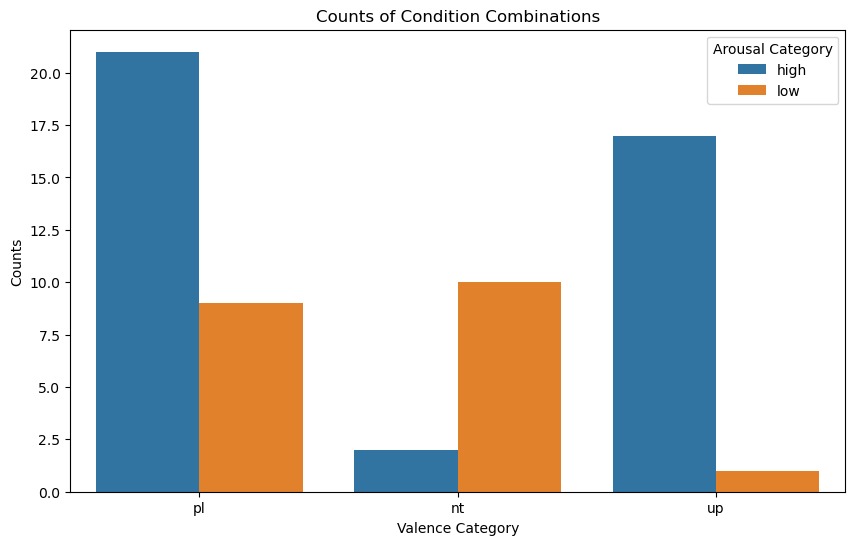

In [19]:
import seaborn as sns
# Count the occurrences of each combination
combination_counts = flag_file.groupby(['valence_category', 'arousal_category']).size().reset_index(name='counts')

# Plot the counts
plt.figure(figsize=(10, 6))
sns.barplot(data=combination_counts, x='valence_category', y='counts', hue='arousal_category', order=['pl', 'nt', 'up'])
plt.title('Counts of Condition Combinations')
plt.xlabel('Valence Category')
plt.ylabel('Counts')
plt.legend(title='Arousal Category')
plt.show()

In [23]:
# Merge with the flag_file on 'iaps_id' to add the 'animacy', 'valence_category', and 'arousal_category' columns
stim_with_flags = stim.merge(flag_file[['iaps_id', 'animacy', 'valence_category', 'arousal_category', 'mean_a','mean_v']], on='iaps_id', how='left')


# Display the final output with the face_flag column
stim_with_flags

,stim_order,type,iaps_id,animacy,valence_category,arousal_category,mean_a,mean_v
0,1,Pl,4680,Y,pl,high,6.02,7.25
1,2,Pl,4641,Y,pl,high,5.43,7.20
2,3,Pl,8250,Y,pl,high,5.04,6.19
3,4,Pl,8186,Y,pl,high,6.84,7.01
4,5,Pl,4626,Y,pl,high,5.78,7.60
5,6,Pl,2057,Y,pl,low,4.54,7.81
6,7,Pl,4624,Y,pl,high,5.02,6.84
7,8,Pl,4311,Y,pl,high,6.67,6.66
8,9,Pl,4597,Y,pl,high,5.91,6.95
9,10,Pl,4694,Y,pl,high,6.42,6.69


In [32]:
from scipy.spatial.distance import pdist, squareform
from scipy.stats import zscore

# Calculate the RDM for mean_v using Euclidean distance
rdm_mean_v = squareform(pdist(stim_with_flags[['mean_v']], metric='euclidean'))

# Calculate the RDM for mean_a using Euclidean distance
rdm_mean_a = squareform(pdist(stim_with_flags[['mean_a']], metric='euclidean'))

# Z-standardize the float distance RDMs
rdm_mean_v_z = zscore(rdm_mean_v, axis=None)
rdm_mean_a_z = zscore(rdm_mean_a, axis=None)

# Min-max scale the standardized RDMs to [0, 1]
rdm_mean_v_scaled = (rdm_mean_v_z - rdm_mean_v_z.min()) / (rdm_mean_v_z.max() - rdm_mean_v_z.min())
rdm_mean_a_scaled = (rdm_mean_a_z - rdm_mean_a_z.min()) / (rdm_mean_a_z.max() - rdm_mean_a_z.min())


# Calculate the similarity-based animacy RDM
animacy = stim_with_flags['animacy'].values
rdm_similarity_animacy = np.zeros((len(animacy), len(animacy)))

for i in range(len(animacy)):
    for j in range(len(animacy)):
        if animacy[i] == animacy[j]:
            rdm_similarity_animacy[i, j] = 1
        else:
            rdm_similarity_animacy[i, j] = -1

# Calculate the discrimination-based animacy RDM
rdm_discrimination_animacy = np.zeros((len(animacy), len(animacy)))

for i in range(len(animacy)):
    for j in range(len(animacy)):
        if animacy[i] == animacy[j]:
            if animacy[i] == 'Y':
                rdm_discrimination_animacy[i, j] = 1
            else:
                rdm_discrimination_animacy[i, j] = -1
        else:
            rdm_discrimination_animacy[i, j] = 0

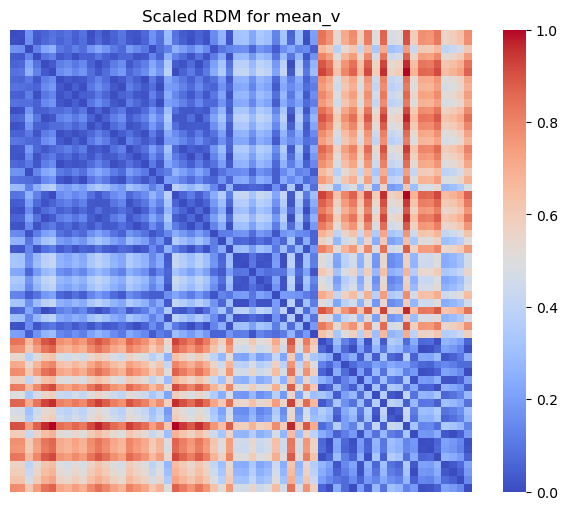

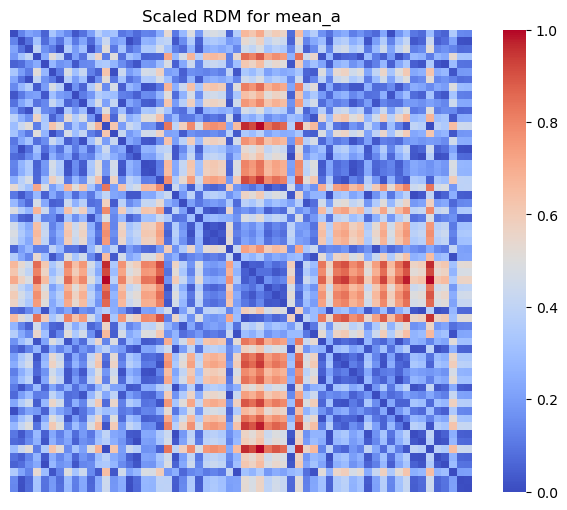

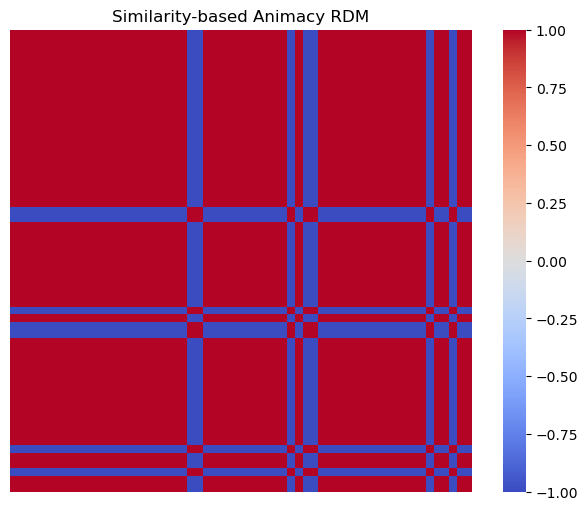

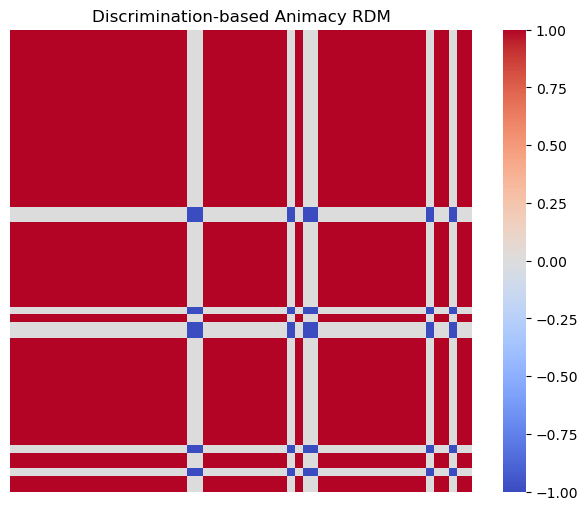

In [33]:
# Function to plot an RDM
def plot_rdm(rdm, title):
    plt.figure(figsize=(8, 6))
    sns.heatmap(rdm, cmap='coolwarm', cbar=True, square=True, xticklabels=False, yticklabels=False)
    plt.title(title)
    plt.show()

# Visualize the RDMs
plot_rdm(rdm_mean_v_scaled, "Scaled RDM for mean_v")
plot_rdm(rdm_mean_a_scaled, "Scaled RDM for mean_a")
plot_rdm(rdm_similarity_animacy, "Similarity-based Animacy RDM")
plot_rdm(rdm_discrimination_animacy, "Discrimination-based Animacy RDM")

# Searchlight with valence and arousal seperated in GLM

In [36]:
import numpy as np
from sklearn.linear_model import LinearRegression
from rsatoolbox.util.searchlight import get_searchlight_RDMs

def upper_tri(RDM):
    """upper_tri returns the upper triangular index of an RDM"""
    m = RDM.shape[0]
    r, c = np.triu_indices(m, 1)
    return RDM[r, c]

def fit_glm_to_rdm(neural_rdm_flat, rdm_mean_v_flat, rdm_mean_a_flat, rdm_similarity_animacy_flat, rdm_discrimination_animacy_flat):
    # Use the flattened RDMs directly
    y = neural_rdm_flat  # Neural RDM is already flattened
    
    # Main effects
    X_mean_v = rdm_mean_v_flat
    X_mean_a = rdm_mean_a_flat
    X_similarity_animacy = rdm_similarity_animacy_flat
    X_discrimination_animacy = rdm_discrimination_animacy_flat
    
    # Interaction terms
    X_interaction_va = X_mean_v * X_mean_a
    X_interaction_vs = X_mean_v * X_similarity_animacy
    X_interaction_vd = X_mean_v * X_discrimination_animacy
    X_interaction_as = X_mean_a * X_similarity_animacy
    X_interaction_ad = X_mean_a * X_discrimination_animacy
    # X_interaction_sd = X_similarity_animacy * X_discrimination_animacy
    X_interaction_vas = X_mean_v * X_mean_a * X_similarity_animacy
    X_interaction_vad = X_mean_v * X_mean_a * X_discrimination_animacy
    # X_interaction_vsd = X_mean_v * X_similarity_animacy * X_discrimination_animacy
    # X_interaction_asd = X_mean_a * X_similarity_animacy * X_discrimination_animacy
    # X_interaction_vasd = X_mean_v * X_mean_a * X_similarity_animacy * X_discrimination_animacy
    
    # Stack the predictors
    X = np.vstack([
        X_mean_v, X_mean_a, X_similarity_animacy, X_discrimination_animacy,
        X_interaction_va, X_interaction_vs, X_interaction_vd, X_interaction_as, X_interaction_ad,
        X_interaction_vas, X_interaction_vad
    ]).T
    
    # Fit the GLM model using linear regression
    glm = LinearRegression().fit(X, y)
    
    # Return the regression coefficients (betas)
    return glm.coef_

def searchlight_analysis(allsub_avg, centers, neighbors, rdm_mean_v, rdm_mean_a, rdm_similarity_animacy, rdm_discrimination_animacy):
    n_subjects = allsub_avg.shape[0]
    eval_score_list = []

    # Flatten the RDMs
    rdm_mean_v_flat = upper_tri(rdm_mean_v)
    rdm_mean_a_flat = upper_tri(rdm_mean_a)
    rdm_similarity_animacy_flat = upper_tri(rdm_similarity_animacy)
    rdm_discrimination_animacy_flat = upper_tri(rdm_discrimination_animacy)
    
    for i in range(n_subjects):
        subj_data = allsub_avg[i]  # Get data for subject i
        
        # Generate searchlight RDMs for this subject
        subj_data_2d = np.nan_to_num(subj_data)

        image_value = np.arange(60)
        SL_RDMs = get_searchlight_RDMs(subj_data_2d, centers, neighbors, image_value, method='correlation')

        # The RDMs object contains several RDM matrices, let's extract them
        for idx, rdm in enumerate(SL_RDMs):
            # Extract the RDM corresponding to the voxel center at index 'idx'
            rdm_neural_flat = rdm.dissimilarities.flatten()  # Use the flattened dissimilarities
         
            # Fit GLM to the neural RDM at this center
            betas = fit_glm_to_rdm(
                rdm_neural_flat, rdm_mean_v_flat, rdm_mean_a_flat,
                rdm_similarity_animacy_flat, rdm_discrimination_animacy_flat
            )
            
            # Store the results (can be further processed or averaged over subjects)
            eval_score_list.append((centers[idx], betas))
    
    return eval_score_list

In [34]:
# Import mask
mask = np.load("./mask.npy")
centers, neighbors = get_volume_searchlight(mask, radius=5, threshold=0.5)

Finding searchlights...: 100%|██████████| 59159/59159 [00:33<00:00, 1749.83it/s]


Found 56949 searchlights


In [37]:
eval_score_list = searchlight_analysis(allsub_avg, centers, neighbors, rdm_mean_v, rdm_mean_a, rdm_similarity_animacy, rdm_discrimination_animacy)


Calculating RDMs...: 100%|██████████| 100/100 [05:15<00:00,  3.16s/it]


In [60]:
# Define the file path where you want to save the pickle file
file_path = './eval_score_list_animacy_va.pkl'

# Save eval_score_list to a pickle file
with open(file_path, 'wb') as file:
    pickle.dump(eval_score_list, file)


In [42]:
import numpy as np
from scipy import stats
from statsmodels.stats.multitest import fdrcorrection

# Assuming eval_score_list is already defined and contains betas for all terms

n_subjects = 20
n_voxel_centers = len(eval_score_list) // n_subjects

# Extract betas for each term and reshape
betas_mean_v = np.array([betas[0] for _, betas in eval_score_list]).reshape(n_subjects, n_voxel_centers)
betas_mean_a = np.array([betas[1] for _, betas in eval_score_list]).reshape(n_subjects, n_voxel_centers)
betas_similarity_animacy = np.array([betas[2] for _, betas in eval_score_list]).reshape(n_subjects, n_voxel_centers)
betas_discrimination_animacy = np.array([betas[3] for _, betas in eval_score_list]).reshape(n_subjects, n_voxel_centers)

# Extract betas for interaction terms
betas_interaction_va = np.array([betas[4] for _, betas in eval_score_list]).reshape(n_subjects, n_voxel_centers)
betas_interaction_vs = np.array([betas[5] for _, betas in eval_score_list]).reshape(n_subjects, n_voxel_centers)
betas_interaction_vd = np.array([betas[6] for _, betas in eval_score_list]).reshape(n_subjects, n_voxel_centers)
betas_interaction_as = np.array([betas[7] for _, betas in eval_score_list]).reshape(n_subjects, n_voxel_centers)
betas_interaction_ad = np.array([betas[8] for _, betas in eval_score_list]).reshape(n_subjects, n_voxel_centers)
betas_interaction_vas = np.array([betas[9] for _, betas in eval_score_list]).reshape(n_subjects, n_voxel_centers)
betas_interaction_vad = np.array([betas[10] for _, betas in eval_score_list]).reshape(n_subjects, n_voxel_centers)

# Perform t-tests across subjects for each term
t_values_mean_v, p_values_mean_v = stats.ttest_1samp(betas_mean_v, 0, axis=0)
t_values_mean_a, p_values_mean_a = stats.ttest_1samp(betas_mean_a, 0, axis=0)
t_values_similarity_animacy, p_values_similarity_animacy = stats.ttest_1samp(betas_similarity_animacy, 0, axis=0)
t_values_discrimination_animacy, p_values_discrimination_animacy = stats.ttest_1samp(betas_discrimination_animacy, 0, axis=0)

# Perform t-tests for interaction terms
t_values_interaction_va, p_values_interaction_va = stats.ttest_1samp(betas_interaction_va, 0, axis=0)
t_values_interaction_vs, p_values_interaction_vs = stats.ttest_1samp(betas_interaction_vs, 0, axis=0)
t_values_interaction_vd, p_values_interaction_vd = stats.ttest_1samp(betas_interaction_vd, 0, axis=0)
t_values_interaction_as, p_values_interaction_as = stats.ttest_1samp(betas_interaction_as, 0, axis=0)
t_values_interaction_ad, p_values_interaction_ad = stats.ttest_1samp(betas_interaction_ad, 0, axis=0)
t_values_interaction_vas, p_values_interaction_vas = stats.ttest_1samp(betas_interaction_vas, 0, axis=0)
t_values_interaction_vad, p_values_interaction_vad = stats.ttest_1samp(betas_interaction_vad, 0, axis=0)

# Apply FDR correction
_, p_values_mean_v_fdr = fdrcorrection(p_values_mean_v, alpha=0.05)
_, p_values_mean_a_fdr = fdrcorrection(p_values_mean_a, alpha=0.05)
_, p_values_similarity_animacy_fdr = fdrcorrection(p_values_similarity_animacy, alpha=0.05)
_, p_values_discrimination_animacy_fdr = fdrcorrection(p_values_discrimination_animacy, alpha=0.05)

# Apply FDR correction for interaction terms
_, p_values_interaction_va_fdr = fdrcorrection(p_values_interaction_va, alpha=0.05)
_, p_values_interaction_vs_fdr = fdrcorrection(p_values_interaction_vs, alpha=0.05)
_, p_values_interaction_vd_fdr = fdrcorrection(p_values_interaction_vd, alpha=0.05)
_, p_values_interaction_as_fdr = fdrcorrection(p_values_interaction_as, alpha=0.05)
_, p_values_interaction_ad_fdr = fdrcorrection(p_values_interaction_ad, alpha=0.05)
_, p_values_interaction_vas_fdr = fdrcorrection(p_values_interaction_vas, alpha=0.05)
_, p_values_interaction_vad_fdr = fdrcorrection(p_values_interaction_vad, alpha=0.05)

# Select significant voxel centers
significant_mean_v = p_values_mean_v_fdr < 0.01
significant_mean_a = p_values_mean_a_fdr < 0.01
significant_similarity_animacy = p_values_similarity_animacy_fdr < 0.01
significant_discrimination_animacy = p_values_discrimination_animacy_fdr < 0.01

# Select significant voxel centers for interaction terms
significant_interaction_va = p_values_interaction_va_fdr < 0.01
significant_interaction_vs = p_values_interaction_vs_fdr < 0.01
significant_interaction_vd = p_values_interaction_vd_fdr < 0.01
significant_interaction_as = p_values_interaction_as_fdr < 0.01
significant_interaction_ad = p_values_interaction_ad_fdr < 0.01
significant_interaction_vas = p_values_interaction_vas_fdr < 0.01
significant_interaction_vad = p_values_interaction_vad_fdr < 0.01

# Print the number of significant voxel centers for each term
print(f"Significant mean_v voxel centers: {np.sum(significant_mean_v)}")
print(f"Significant mean_a voxel centers: {np.sum(significant_mean_a)}")
print(f"Significant similarity animacy voxel centers: {np.sum(significant_similarity_animacy)}")
print(f"Significant discrimination animacy voxel centers: {np.sum(significant_discrimination_animacy)}")

# Print the number of significant voxel centers for interaction terms
print(f"Significant interaction va voxel centers: {np.sum(significant_interaction_va)}")
print(f"Significant interaction vs voxel centers: {np.sum(significant_interaction_vs)}")
print(f"Significant interaction vd voxel centers: {np.sum(significant_interaction_vd)}")
print(f"Significant interaction as voxel centers: {np.sum(significant_interaction_as)}")
print(f"Significant interaction ad voxel centers: {np.sum(significant_interaction_ad)}")
print(f"Significant interaction vas voxel centers: {np.sum(significant_interaction_vas)}")
print(f"Significant interaction vad voxel centers: {np.sum(significant_interaction_vad)}")

Significant mean_v voxel centers: 2177
Significant mean_a voxel centers: 406
Significant similarity animacy voxel centers: 3615
Significant discrimination animacy voxel centers: 5493
Significant interaction va voxel centers: 0
Significant interaction vs voxel centers: 1150
Significant interaction vd voxel centers: 279
Significant interaction as voxel centers: 0
Significant interaction ad voxel centers: 2054
Significant interaction vas voxel centers: 0
Significant interaction vad voxel centers: 1294


## Plotting

In [43]:
tmp_image_path = '../IAPS_fMRI_RSA/fMRI_singletrial_betas/nifti/Nt1.img'
# load one image to get the dimensions and make the mask

tmp_img = nib.load(tmp_image_path)

In [45]:
# Dimensions of the voxel space
x, y, z = 53, 63, 46  # Adjust these dimensions to match your data

# Extract unique voxel indices from the first subject's data
n_subjects = 20
voxel_indices = np.array([center for center, _ in eval_score_list[:len(eval_score_list) // n_subjects]])

# Function to map t-values to voxel space and plot
def plot_t_values_in_brain(t_values, significant_mask, title, tmp_img):
    # Initialize an array for the t-statistics in 3D space
    t_stat_sig = np.full((x * y * z), np.nan)
    
    # Map significant t-values to their voxel indices
    significant_voxel_indices = voxel_indices[significant_mask]
    t_stat_sig[significant_voxel_indices] = t_values[significant_mask]
    
    # Reshape the 1D t-statistics array into a 3D array matching the voxel space
    t_stat_sig_3d = t_stat_sig.reshape([x, y, z])
    
    # Create a new image object from the 3D t-statistics
    t_stat_sig_img = new_img_like(tmp_img, t_stat_sig_3d)
    
    # View the image
    view = plotting.view_img(t_stat_sig_img, title=title)
    return view

c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_stat_map.py:198: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\numpy\core\fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



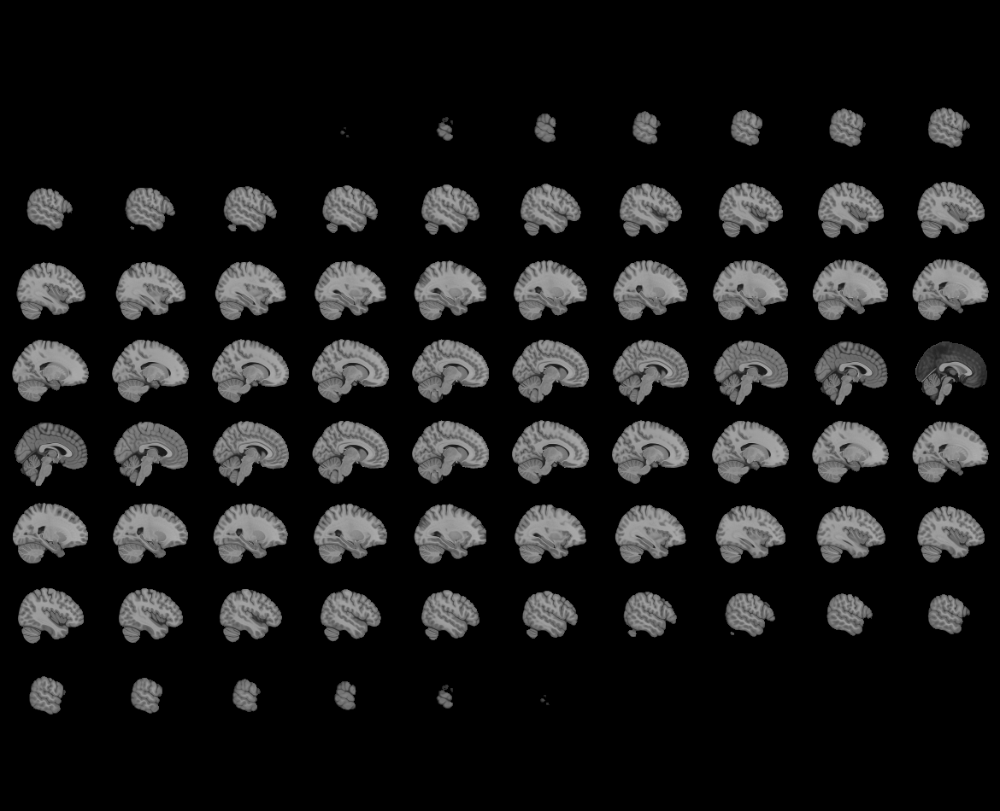
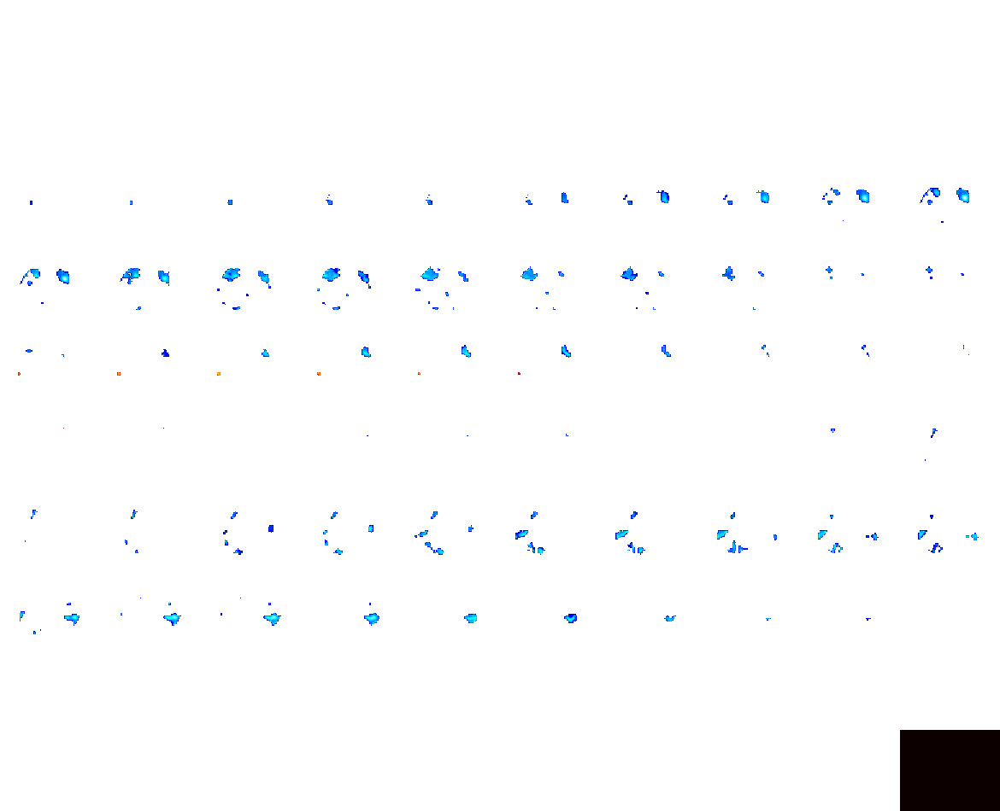

In [46]:
view_behavioral = plot_t_values_in_brain(t_values_mean_v, significant_mean_v, 'Valence T-values', tmp_img)
view_behavioral

c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_stat_map.py:198: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\numpy\core\fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



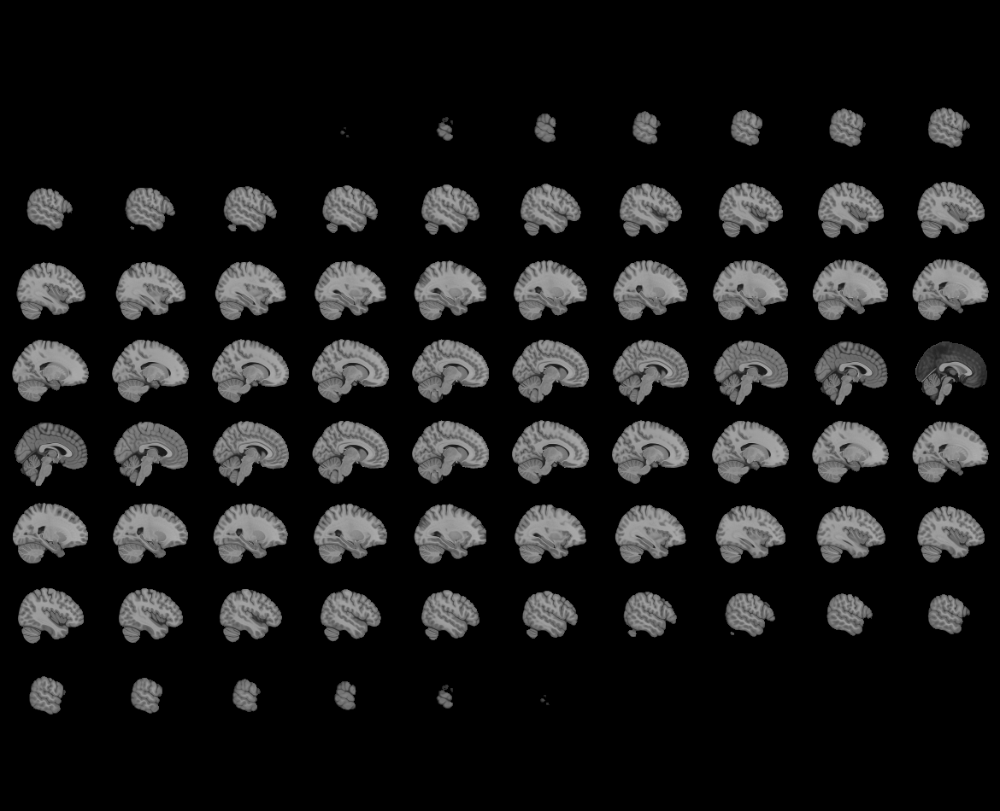
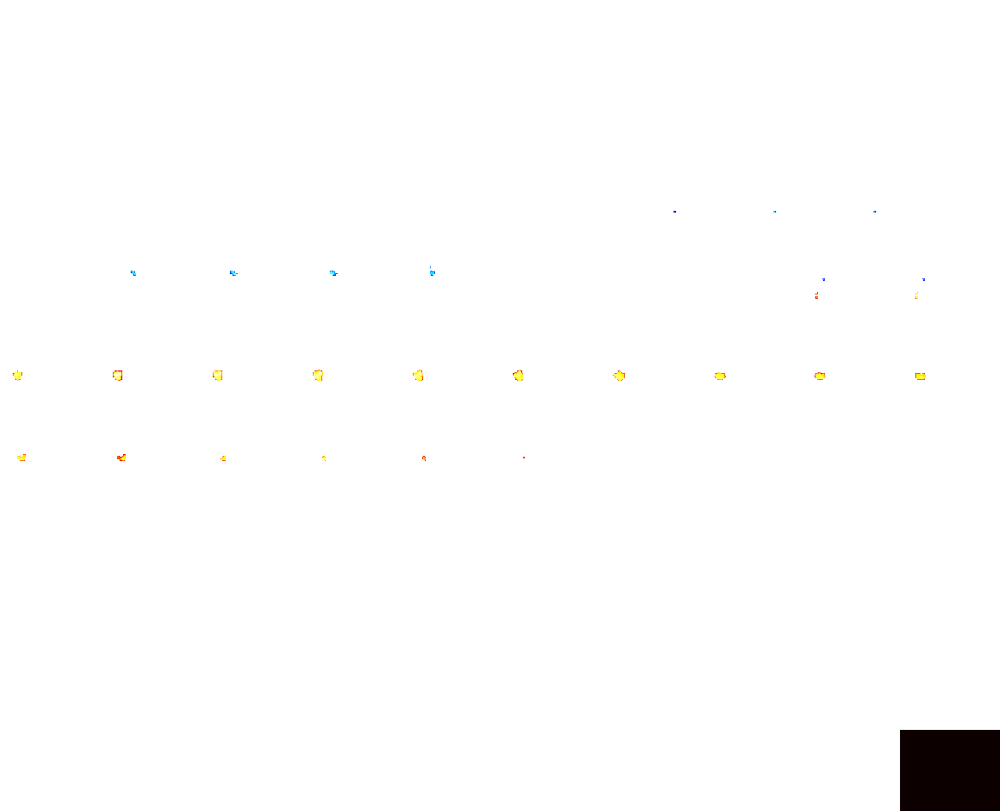

In [47]:
view_behavioral = plot_t_values_in_brain(t_values_mean_a, significant_mean_a, 'Arousal T-values', tmp_img)
view_behavioral

c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_stat_map.py:198: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\numpy\core\fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



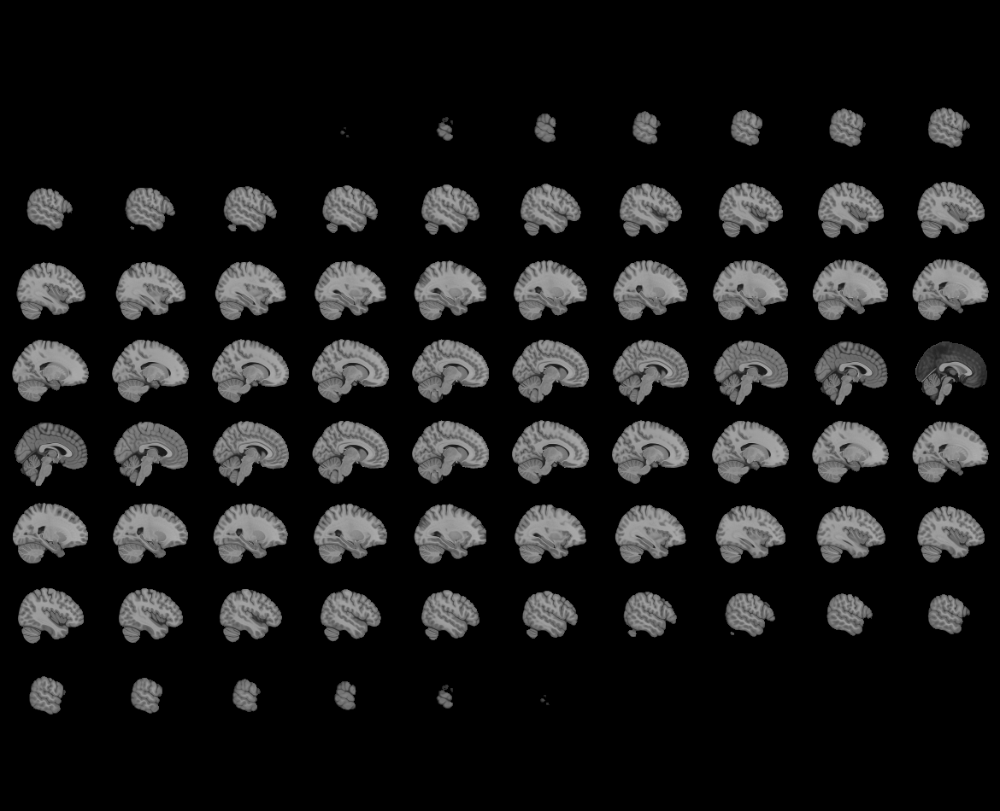
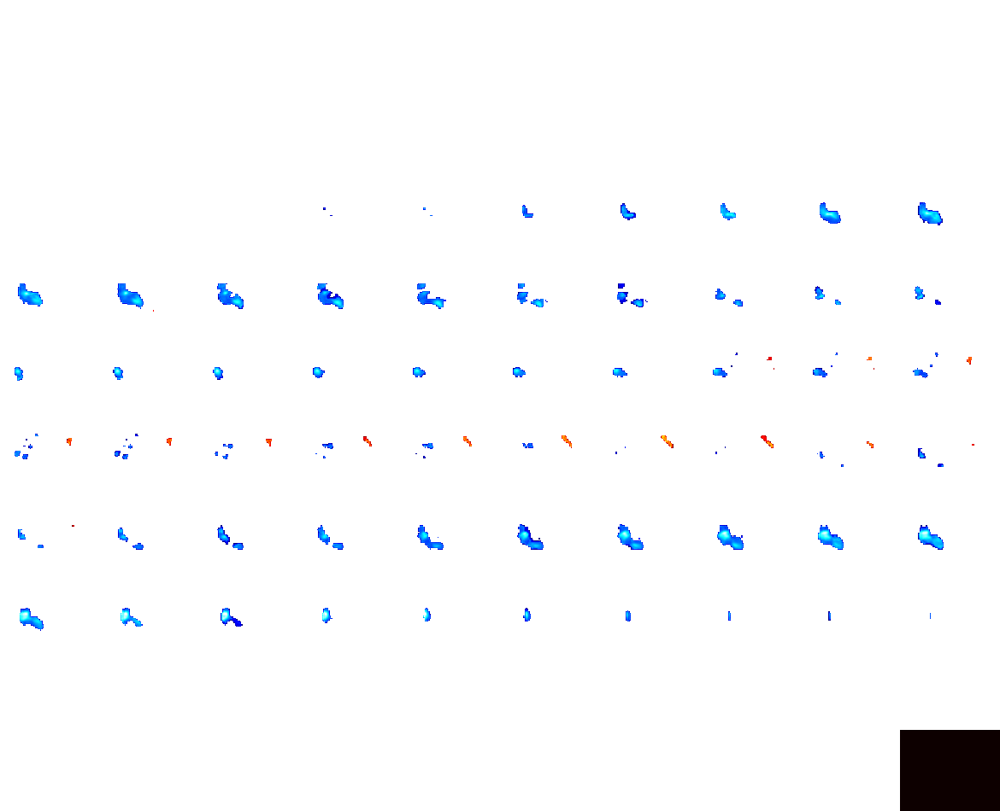

In [48]:
view_behavioral = plot_t_values_in_brain(t_values_similarity_animacy, significant_similarity_animacy, 'Animacy T-values', tmp_img)
view_behavioral

c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_stat_map.py:198: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\numpy\core\fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



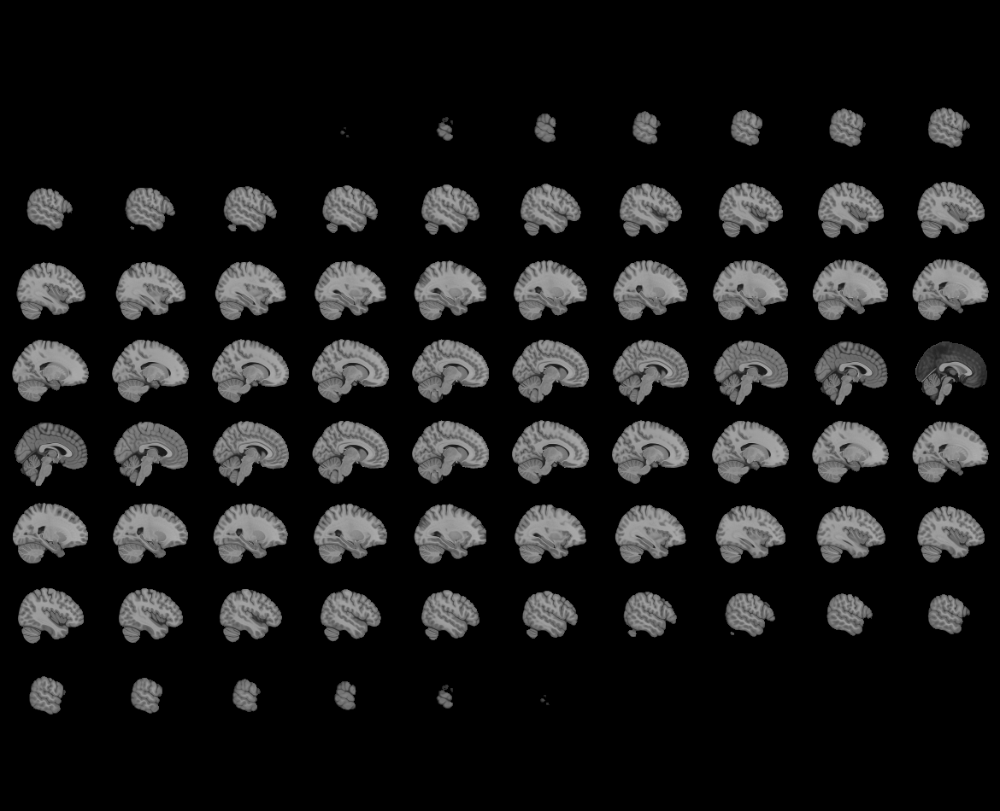
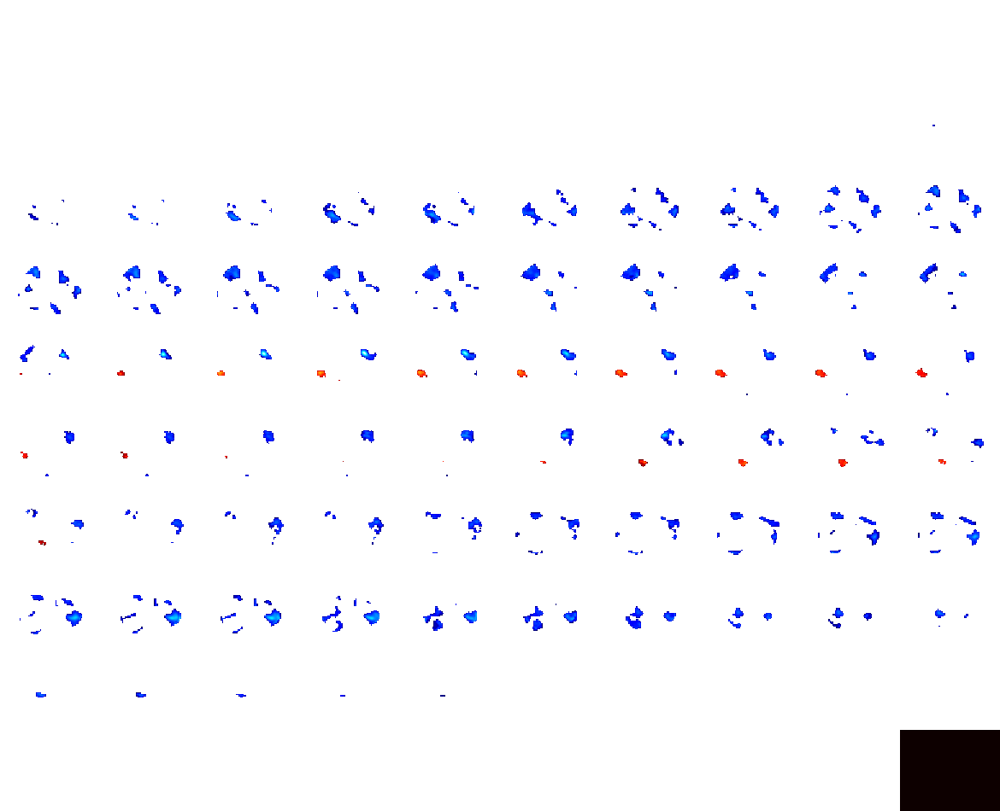

In [49]:
view_behavioral = plot_t_values_in_brain(t_values_discrimination_animacy,  significant_discrimination_animacy , 'Animacy T-values', tmp_img)
view_behavioral

c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_stat_map.py:198: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_stat_map.py:202: UserWarning: The given float value must not exceed 0.0. But, you have given threshold=1e-06.
  data, mask, threshold = _threshold_data(data, threshold)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_stat_map.py:584: UserWarning: The given float value must not exceed 0.0. But, you have given threshold=1e-06.
  colors = colorscale(
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\numpy\core\fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-pa


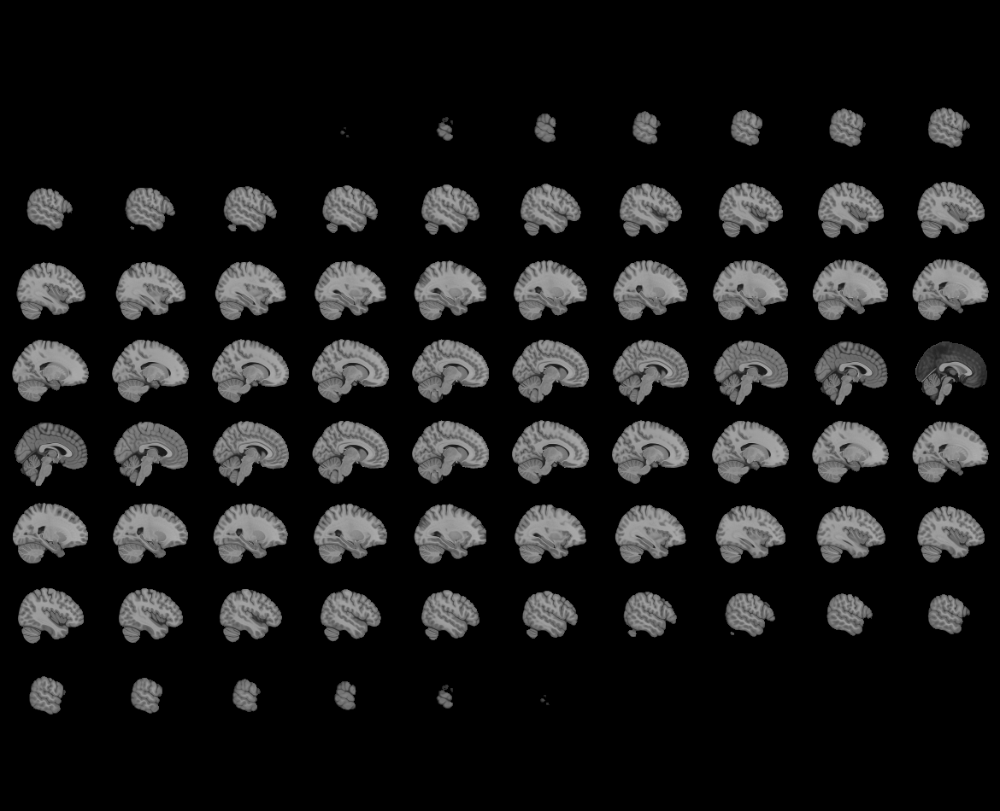
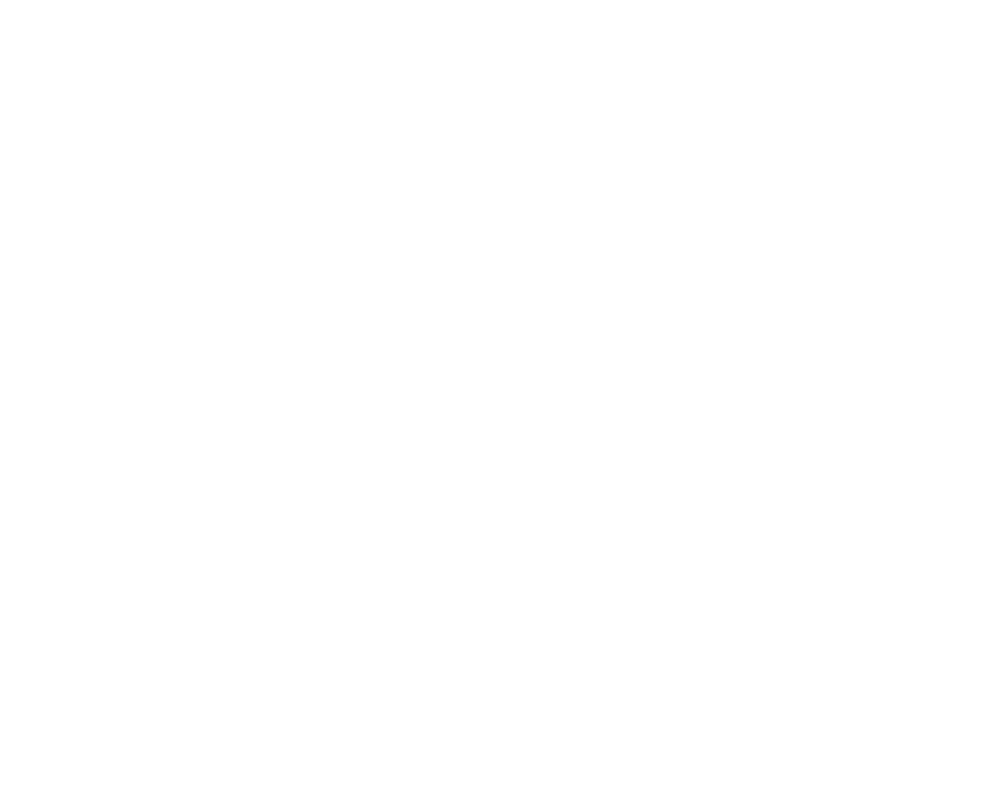

In [50]:
view_behavioral = plot_t_values_in_brain(t_values_interaction_va,  significant_interaction_va  , 'Animacy T-values', tmp_img)
view_behavioral

c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_stat_map.py:198: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\numpy\core\fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



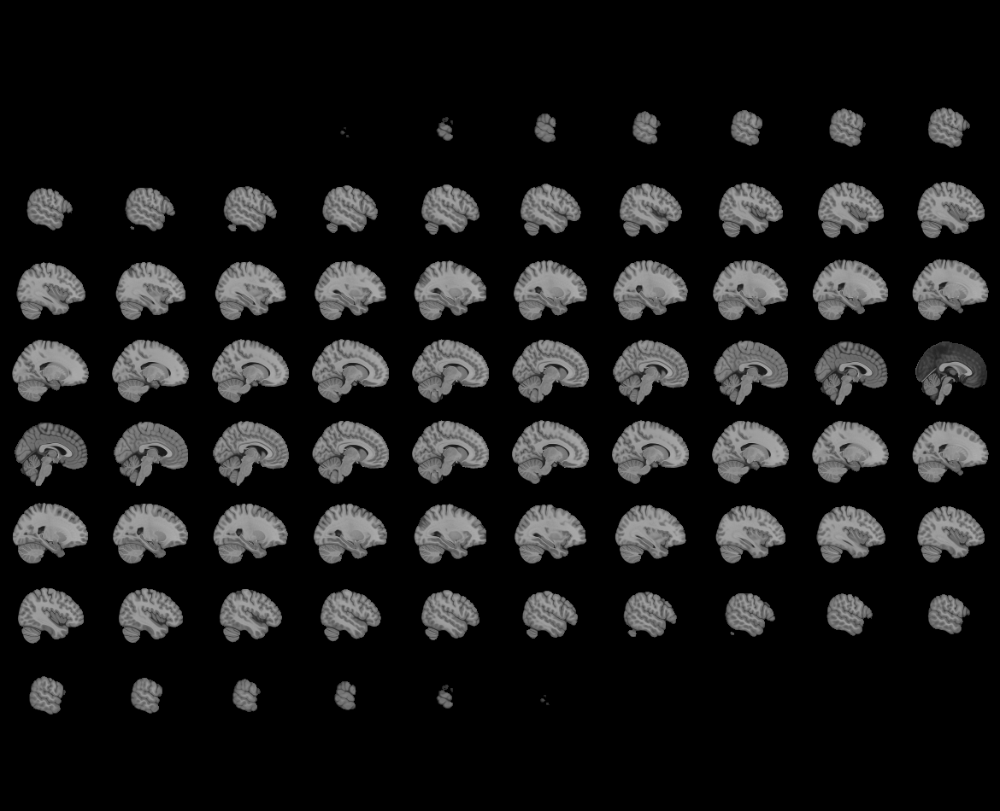
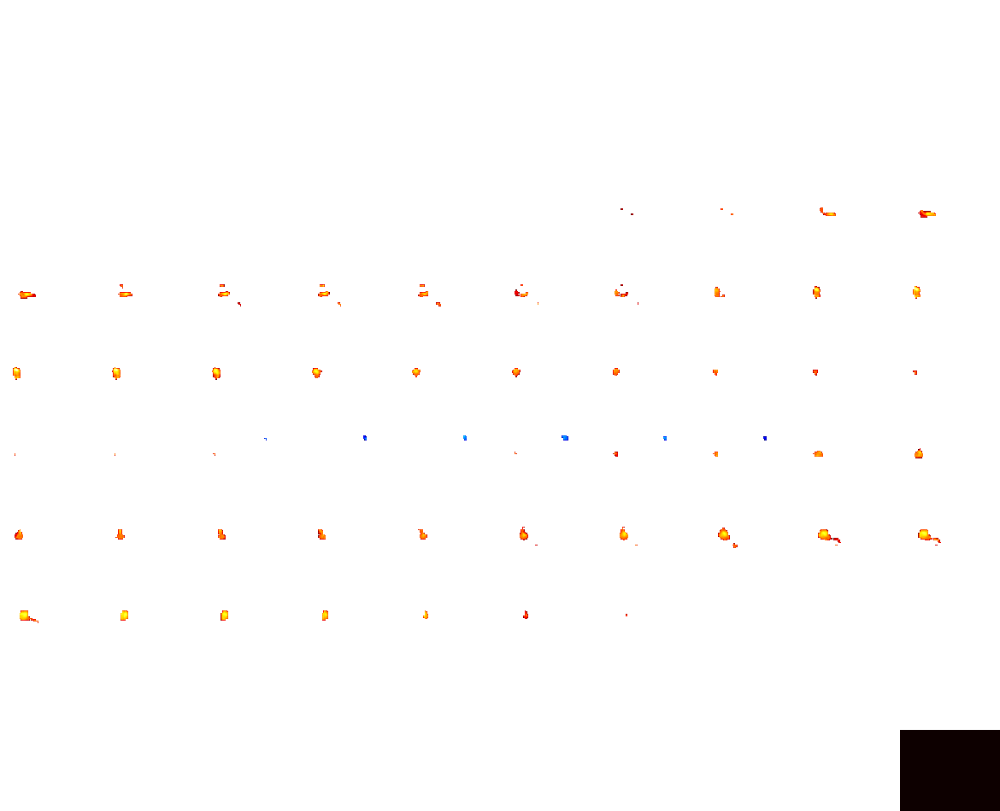

In [51]:
view_behavioral = plot_t_values_in_brain(t_values_interaction_vs,   significant_interaction_vs   , 'Animacy T-values', tmp_img)
view_behavioral

c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_stat_map.py:198: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\numpy\core\fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



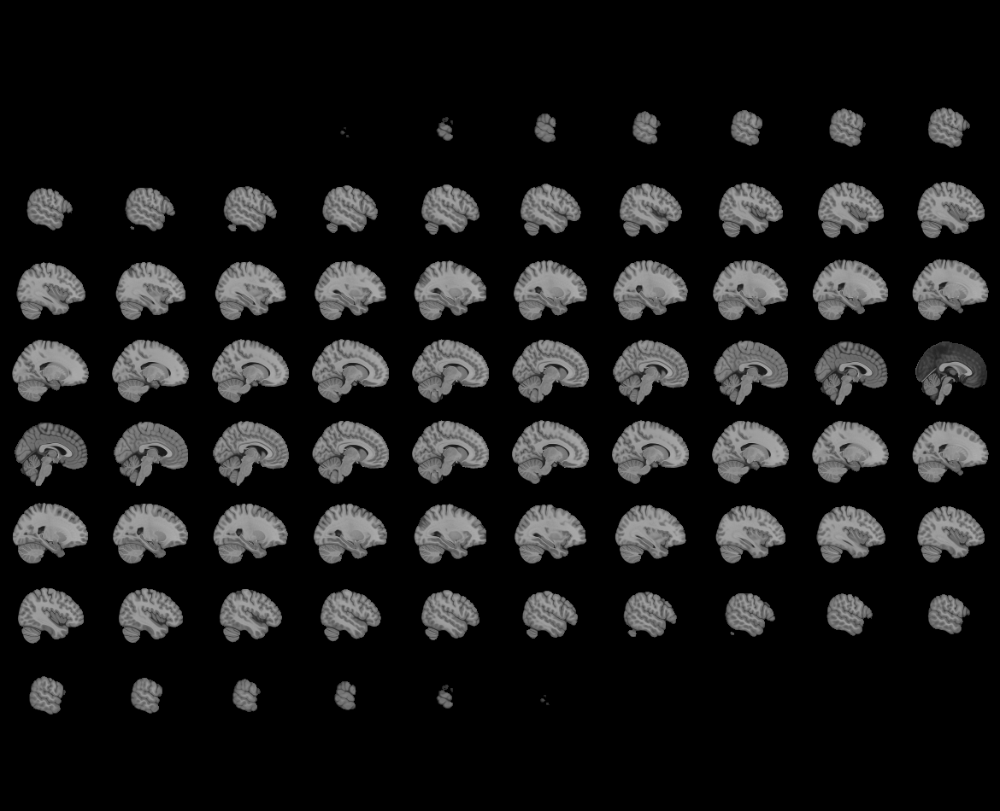
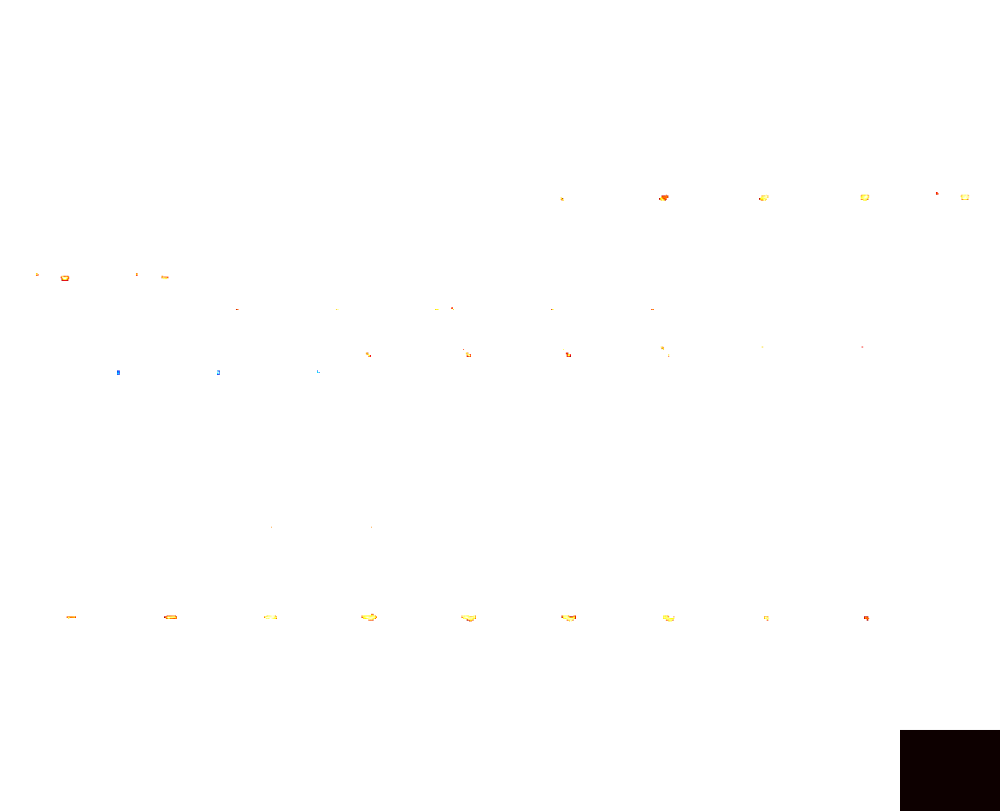

In [52]:
view_behavioral = plot_t_values_in_brain(t_values_interaction_vd,   significant_interaction_vd    , 'Animacy T-values', tmp_img)
view_behavioral

c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_stat_map.py:198: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_stat_map.py:202: UserWarning: The given float value must not exceed 0.0. But, you have given threshold=1e-06.
  data, mask, threshold = _threshold_data(data, threshold)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_stat_map.py:584: UserWarning: The given float value must not exceed 0.0. But, you have given threshold=1e-06.
  colors = colorscale(
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\numpy\core\fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-pa


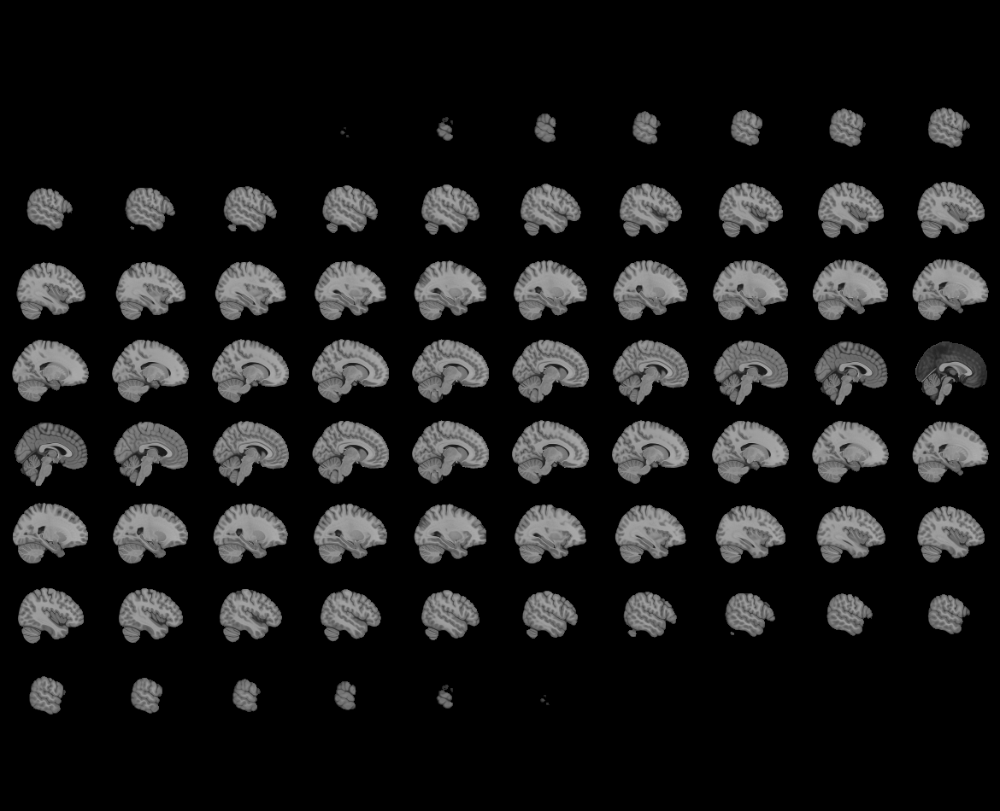
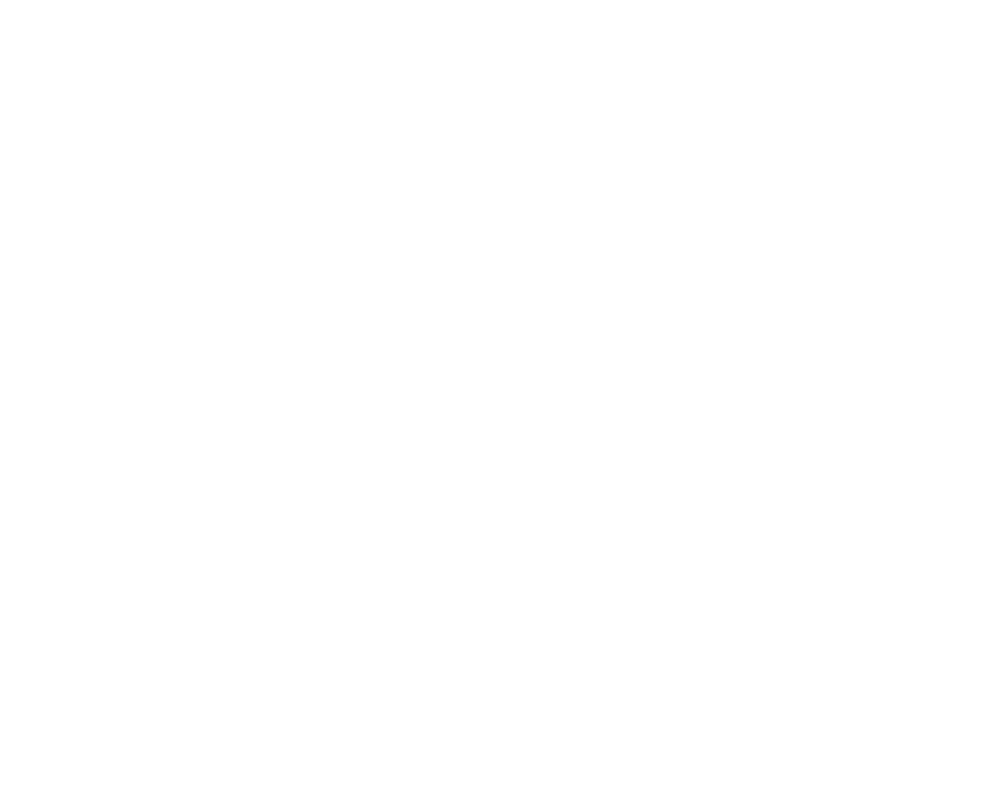

In [54]:
view_behavioral = plot_t_values_in_brain(t_values_interaction_as,    significant_interaction_as     , 'Animacy T-values', tmp_img)
view_behavioral

c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_stat_map.py:198: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\numpy\core\fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



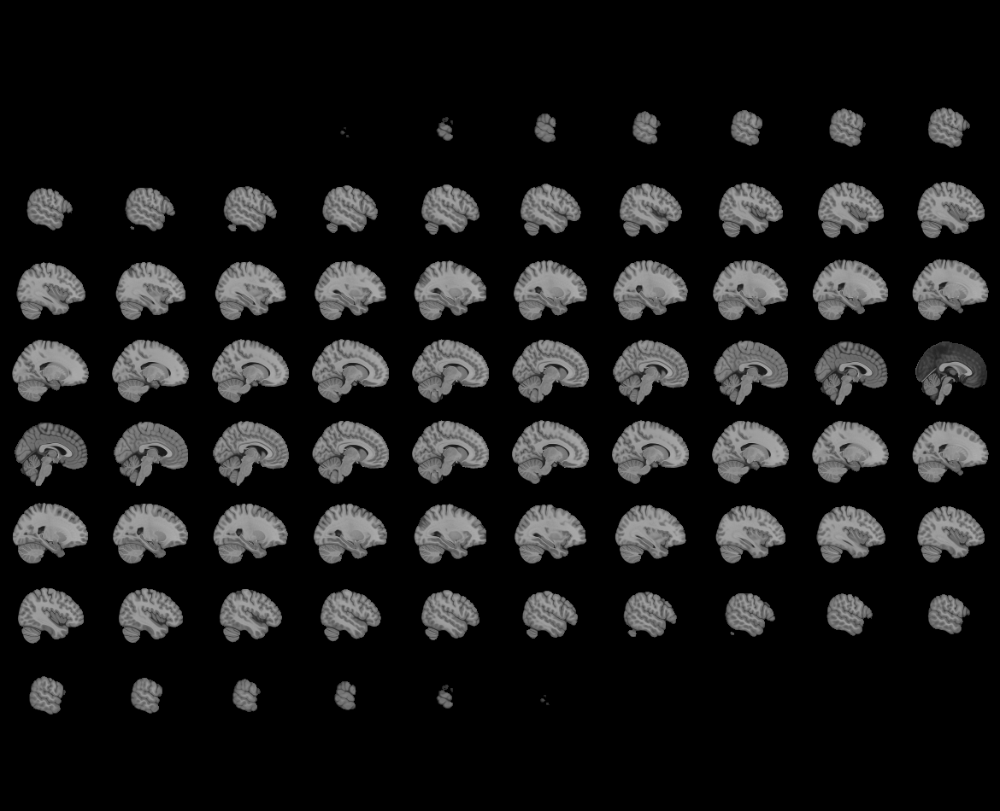
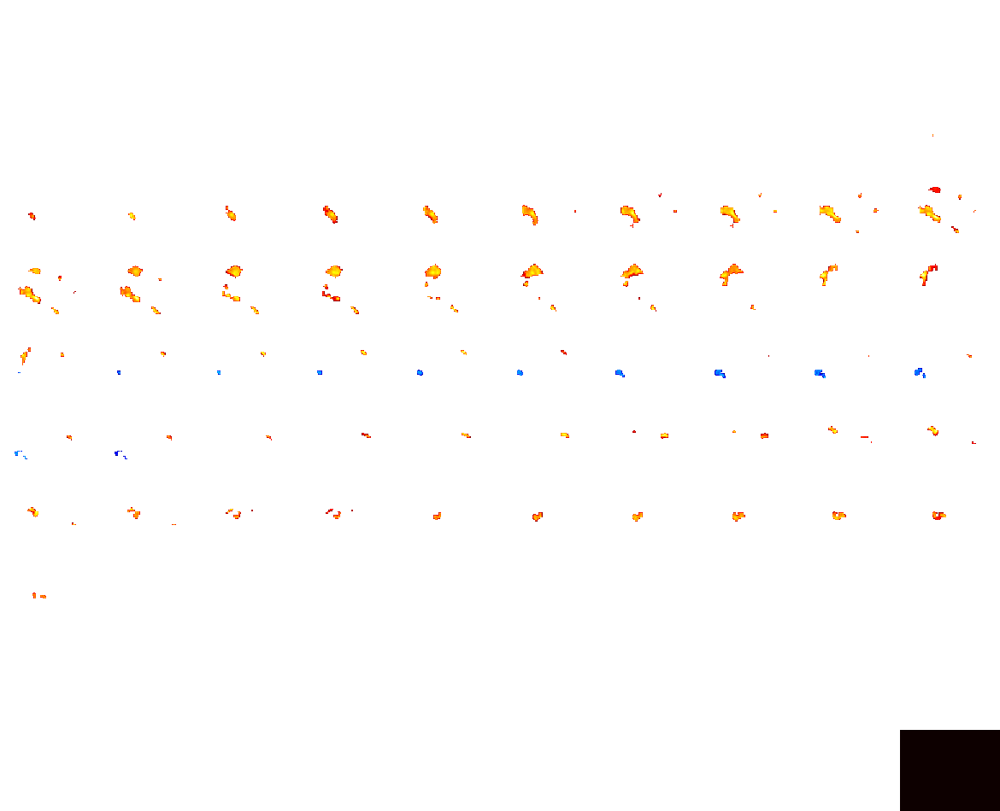

In [55]:
view_behavioral = plot_t_values_in_brain(t_values_interaction_ad,     significant_interaction_ad      , 'Animacy T-values', tmp_img)
view_behavioral

c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_stat_map.py:198: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_stat_map.py:202: UserWarning: The given float value must not exceed 0.0. But, you have given threshold=1e-06.
  data, mask, threshold = _threshold_data(data, threshold)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_stat_map.py:584: UserWarning: The given float value must not exceed 0.0. But, you have given threshold=1e-06.
  colors = colorscale(
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\numpy\core\fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-pa


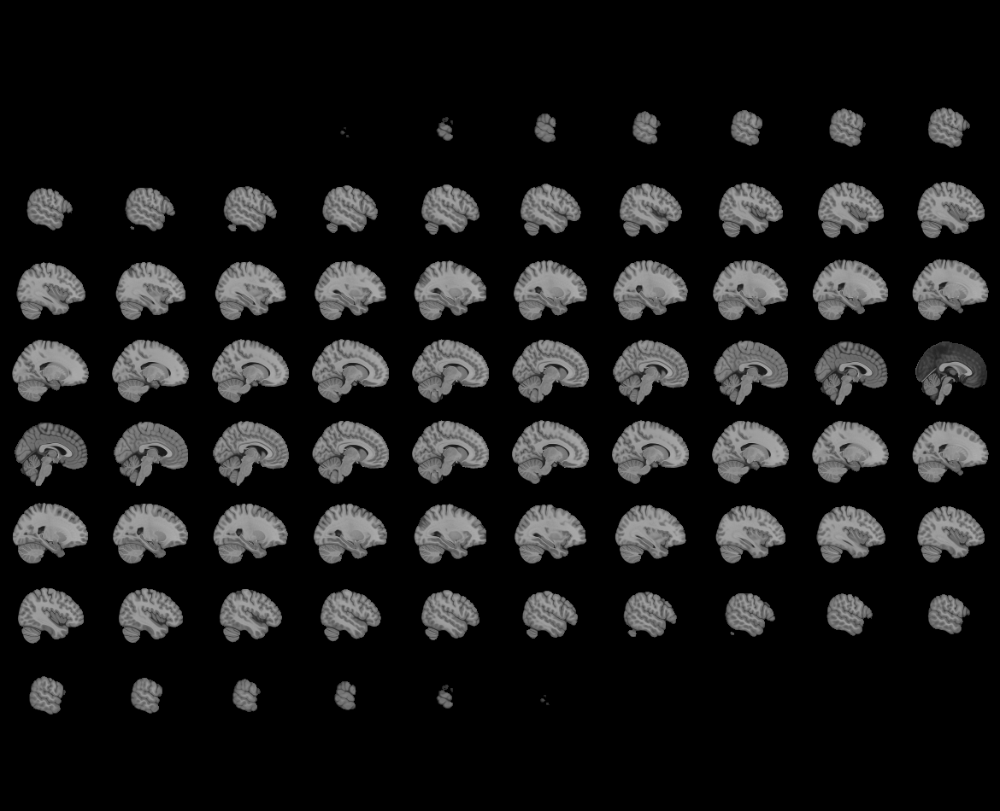
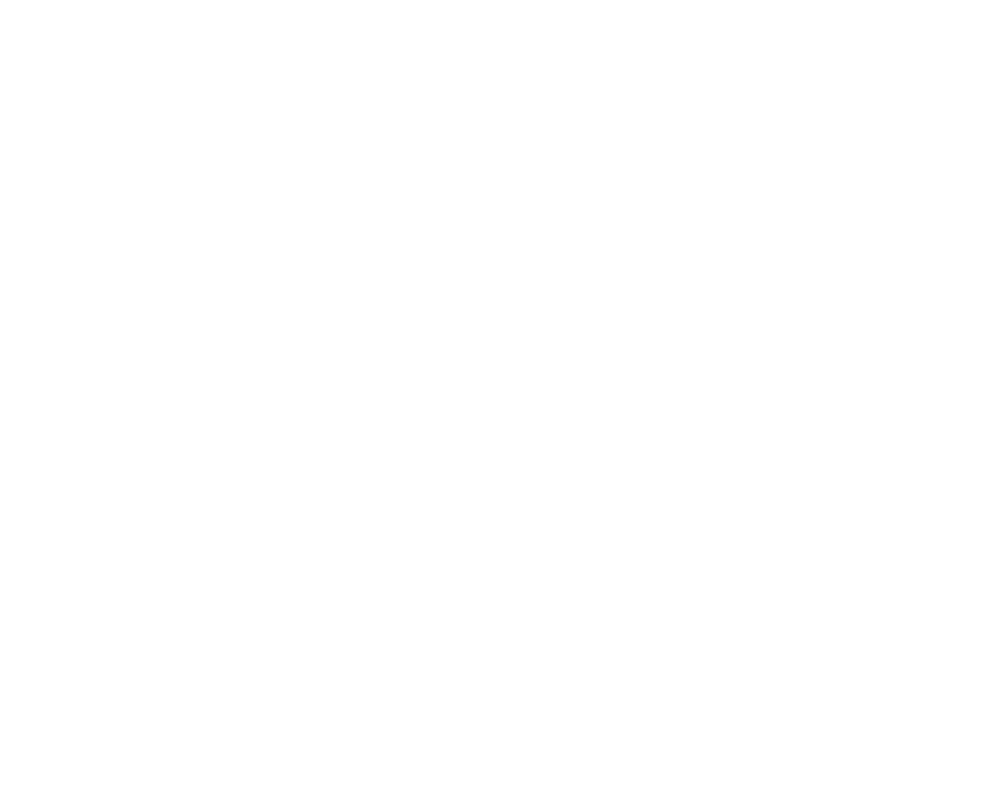

In [56]:
view_behavioral = plot_t_values_in_brain(t_values_interaction_vas,      significant_interaction_vas       , 'Animacy T-values', tmp_img)
view_behavioral

c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_stat_map.py:198: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\numpy\core\fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_document.py:102: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn(



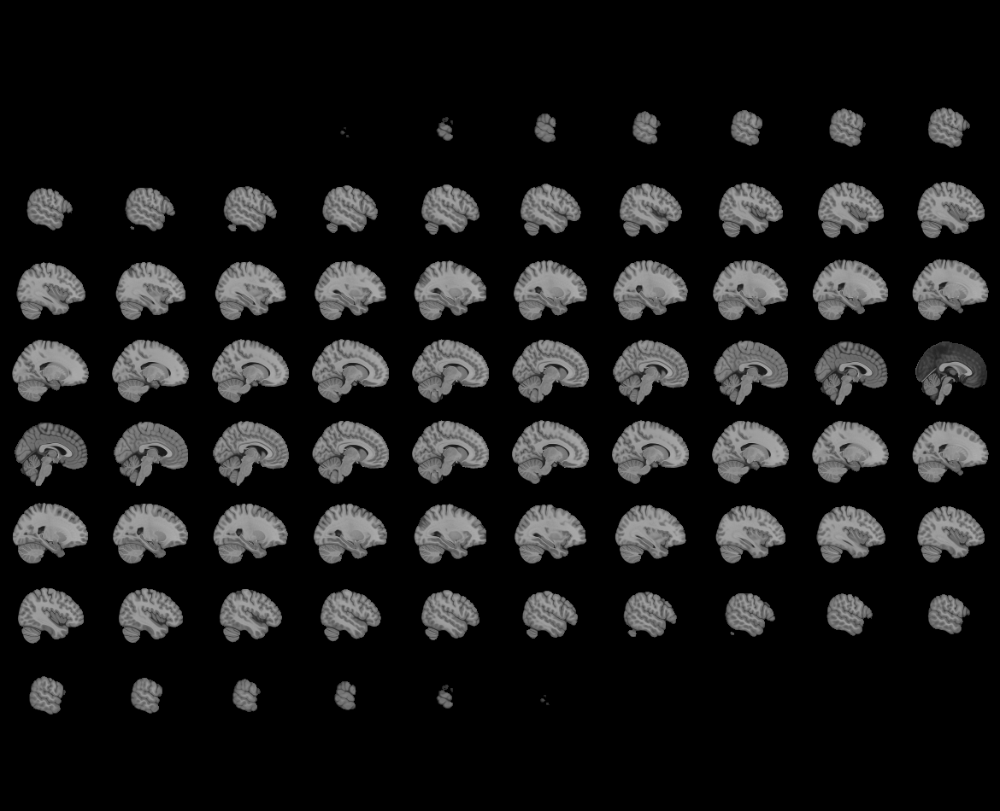
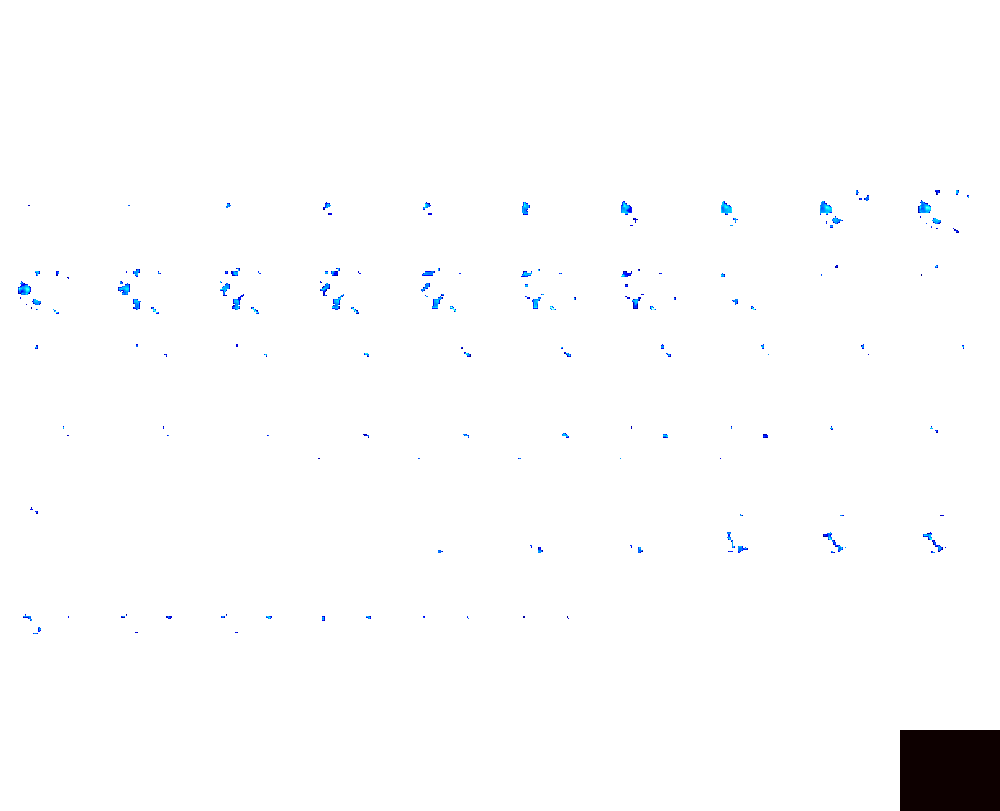

In [57]:
view_behavioral = plot_t_values_in_brain(t_values_interaction_vad,       significant_interaction_vad         , 'Animacy T-values', tmp_img)
view_behavioral

# Searchlight with valence and arousal combined in GLM

In [58]:
rdm_behavioral = pd.read_csv("../IAPS_behavioral_RDM/rdm_behavioral_normed.csv", index_col=0)
rdm_behavioral = np.array(rdm_behavioral)


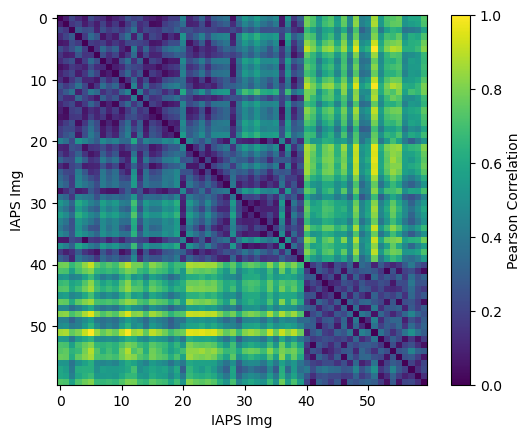

In [70]:
plt.style.use('default')
# make plot
fig, ax = plt.subplots()
  
# show image
shw = ax.imshow(rdm_behavioral)
  
# make bar
bar = plt.colorbar(shw)
  
# show plot with labels
plt.xlabel('IAPS Img')
plt.ylabel('IAPS Img')
bar.set_label('Pearson Correlation')
plt.show()

In [59]:
import numpy as np
from sklearn.linear_model import LinearRegression
from rsatoolbox.util.searchlight import get_searchlight_RDMs

def upper_tri(RDM):
    """upper_tri returns the upper triangular index of an RDM"""
    m = RDM.shape[0]
    r, c = np.triu_indices(m, 1)
    return RDM[r, c]

def fit_glm_to_rdm(neural_rdm_flat, rdm_behavioral_flat, rdm_similarity_animacy_flat, rdm_discrimination_animacy_flat):
    # Use the flattened RDMs directly
    y = neural_rdm_flat  # Neural RDM is already flattened
    
    # Main effects
    X_behavioral = rdm_behavioral_flat
    X_similarity_animacy = rdm_similarity_animacy_flat
    X_discrimination_animacy = rdm_discrimination_animacy_flat
    
    # Interaction terms
    X_interaction_bs = X_behavioral * X_similarity_animacy
    X_interaction_bd = X_behavioral * X_discrimination_animacy
    
    # Stack the predictors
    X = np.vstack([
        X_behavioral, X_similarity_animacy, X_discrimination_animacy,
        X_interaction_bs, X_interaction_bd
    ]).T
    
    # Fit the GLM model using linear regression
    glm = LinearRegression().fit(X, y)
    
    # Return the regression coefficients (betas)
    return glm.coef_

def searchlight_analysis(allsub_avg, centers, neighbors, rdm_behavioral, rdm_similarity_animacy, rdm_discrimination_animacy):
    n_subjects = allsub_avg.shape[0]
    eval_score_list = []

    # Flatten the RDMs
    rdm_behavioral_flat = upper_tri(rdm_behavioral)
    rdm_similarity_animacy_flat = upper_tri(rdm_similarity_animacy)
    rdm_discrimination_animacy_flat = upper_tri(rdm_discrimination_animacy)
    
    for i in range(n_subjects):
        subj_data = allsub_avg[i]  # Get data for subject i
        
        # Generate searchlight RDMs for this subject
        subj_data_2d = np.nan_to_num(subj_data)

        image_value = np.arange(60)
        SL_RDMs = get_searchlight_RDMs(subj_data_2d, centers, neighbors, image_value, method='correlation')

        # The RDMs object contains several RDM matrices, let's extract them
        for idx, rdm in enumerate(SL_RDMs):
            # Extract the RDM corresponding to the voxel center at index 'idx'
            rdm_neural_flat = rdm.dissimilarities.flatten()  # Use the flattened dissimilarities
         
            # Fit GLM to the neural RDM at this center
            betas = fit_glm_to_rdm(
                rdm_neural_flat, rdm_behavioral_flat,
                rdm_similarity_animacy_flat, rdm_discrimination_animacy_flat
            )
            
            # Store the results (can be further processed or averaged over subjects)
            eval_score_list.append((centers[idx], betas))
    
    return eval_score_list

In [61]:
eval_score_list = searchlight_analysis(allsub_avg, centers, neighbors, rdm_behavioral, rdm_similarity_animacy, rdm_discrimination_animacy)


Calculating RDMs...: 100%|██████████| 100/100 [06:03<00:00,  3.63s/it]


In [62]:
# Define the file path where you want to save the pickle file
file_path = './eval_score_list_animacy.pkl'

# Save eval_score_list to a pickle file
with open(file_path, 'wb') as file:
    pickle.dump(eval_score_list, file)


In [63]:
import numpy as np
from scipy import stats
from statsmodels.stats.multitest import fdrcorrection

# Assuming eval_score_list is already defined and contains betas for all terms

n_subjects = 20
n_voxel_centers = len(eval_score_list) // n_subjects

# Extract betas for each term and reshape
betas_behavioral = np.array([betas[0] for _, betas in eval_score_list]).reshape(n_subjects, n_voxel_centers)
betas_similarity_animacy = np.array([betas[1] for _, betas in eval_score_list]).reshape(n_subjects, n_voxel_centers)
betas_discrimination_animacy = np.array([betas[2] for _, betas in eval_score_list]).reshape(n_subjects, n_voxel_centers)

# Extract betas for interaction terms
betas_interaction_bs = np.array([betas[3] for _, betas in eval_score_list]).reshape(n_subjects, n_voxel_centers)
betas_interaction_bd = np.array([betas[4] for _, betas in eval_score_list]).reshape(n_subjects, n_voxel_centers)

# Perform t-tests across subjects for each term
t_values_behavioral, p_values_behavioral = stats.ttest_1samp(betas_behavioral, 0, axis=0)
t_values_similarity_animacy, p_values_similarity_animacy = stats.ttest_1samp(betas_similarity_animacy, 0, axis=0)
t_values_discrimination_animacy, p_values_discrimination_animacy = stats.ttest_1samp(betas_discrimination_animacy, 0, axis=0)

# Perform t-tests for interaction terms
t_values_interaction_bs, p_values_interaction_bs = stats.ttest_1samp(betas_interaction_bs, 0, axis=0)
t_values_interaction_bd, p_values_interaction_bd = stats.ttest_1samp(betas_interaction_bd, 0, axis=0)

# Apply FDR correction
_, p_values_behavioral_fdr = fdrcorrection(p_values_behavioral, alpha=0.05)
_, p_values_similarity_animacy_fdr = fdrcorrection(p_values_similarity_animacy, alpha=0.05)
_, p_values_discrimination_animacy_fdr = fdrcorrection(p_values_discrimination_animacy, alpha=0.05)

# Apply FDR correction for interaction terms
_, p_values_interaction_bs_fdr = fdrcorrection(p_values_interaction_bs, alpha=0.05)
_, p_values_interaction_bd_fdr = fdrcorrection(p_values_interaction_bd, alpha=0.05)

# Select significant voxel centers
significant_behavioral = p_values_behavioral_fdr < 0.01
significant_similarity_animacy = p_values_similarity_animacy_fdr < 0.01
significant_discrimination_animacy = p_values_discrimination_animacy_fdr < 0.01

# Select significant voxel centers for interaction terms
significant_interaction_bs = p_values_interaction_bs_fdr < 0.01
significant_interaction_bd = p_values_interaction_bd_fdr < 0.01

# Store t-values and significant indices in lists
t_values_list = [
    t_values_behavioral,
    t_values_similarity_animacy,
    t_values_discrimination_animacy,
    t_values_interaction_bs,
    t_values_interaction_bd
]

significant_indices_list = [
    significant_behavioral,
    significant_similarity_animacy,
    significant_discrimination_animacy,
    significant_interaction_bs,
    significant_interaction_bd
]

# List of independent variable names
variable_names = [
    "Behavioral",
    "Similarity Animacy",
    "Discrimination Animacy",
    "Interaction BS",
    "Interaction BD"
]

# Print the number of significant voxel centers for each term
for name, significant in zip(variable_names, significant_indices_list):
    print(f"Significant {name} voxel centers: {np.sum(significant)}")

Significant Behavioral voxel centers: 2084
Significant Similarity Animacy voxel centers: 7171
Significant Discrimination Animacy voxel centers: 1556
Significant Interaction BS voxel centers: 5151
Significant Interaction BD voxel centers: 1805


## Plotting

In [ ]:
# Dimensions of the voxel space
x, y, z = 53, 63, 46  # Adjust these dimensions to match your data

# Extract unique voxel indices from the first subject's data
n_subjects = 20
voxel_indices = np.array([center for center, _ in eval_score_list[:len(eval_score_list) // n_subjects]])

# Function to map t-values to voxel space and plot
def plot_t_values_in_brain(t_values, significant_mask, title, tmp_img):
    # Initialize an array for the t-statistics in 3D space
    t_stat_sig = np.full((x * y * z), np.nan)
    
    # Map significant t-values to their voxel indices
    significant_voxel_indices = voxel_indices[significant_mask]
    t_stat_sig[significant_voxel_indices] = t_values[significant_mask]
    
    # Reshape the 1D t-statistics array into a 3D array matching the voxel space
    t_stat_sig_3d = t_stat_sig.reshape([x, y, z])
    
    # Create a new image object from the 3D t-statistics
    t_stat_sig_img = new_img_like(tmp_img, t_stat_sig_3d)
    
    # View the image
    view = plotting.view_img(t_stat_sig_img, title=title)
    return view

c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_stat_map.py:198: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\numpy\core\fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_document.py:102: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn(



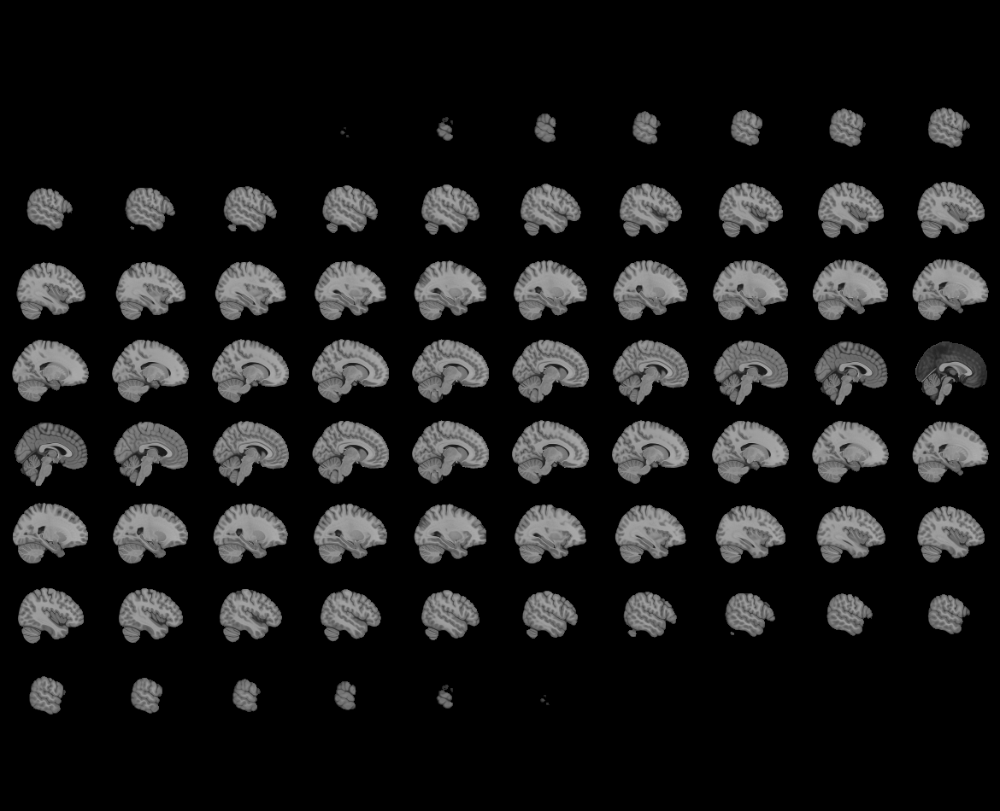
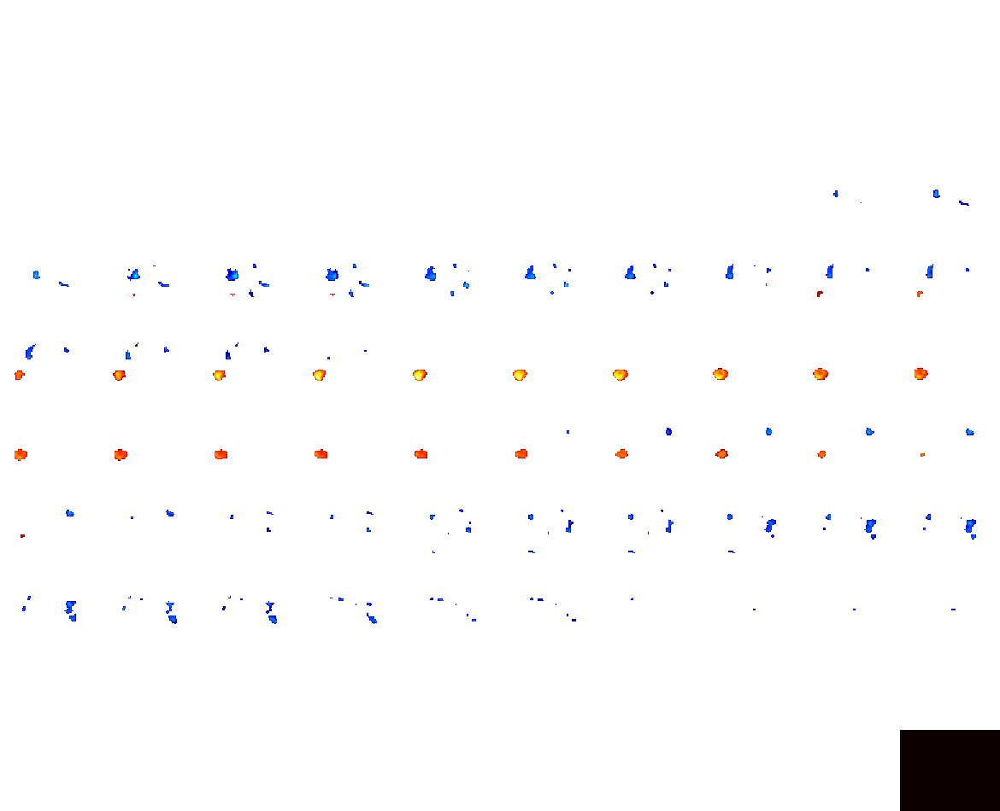

In [65]:
i = 0
view = plot_t_values_in_brain(t_values_list[i], significant_indices_list[i], f'{variable_names[i]}', tmp_img)
view

c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_stat_map.py:198: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\numpy\core\fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_document.py:102: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn(



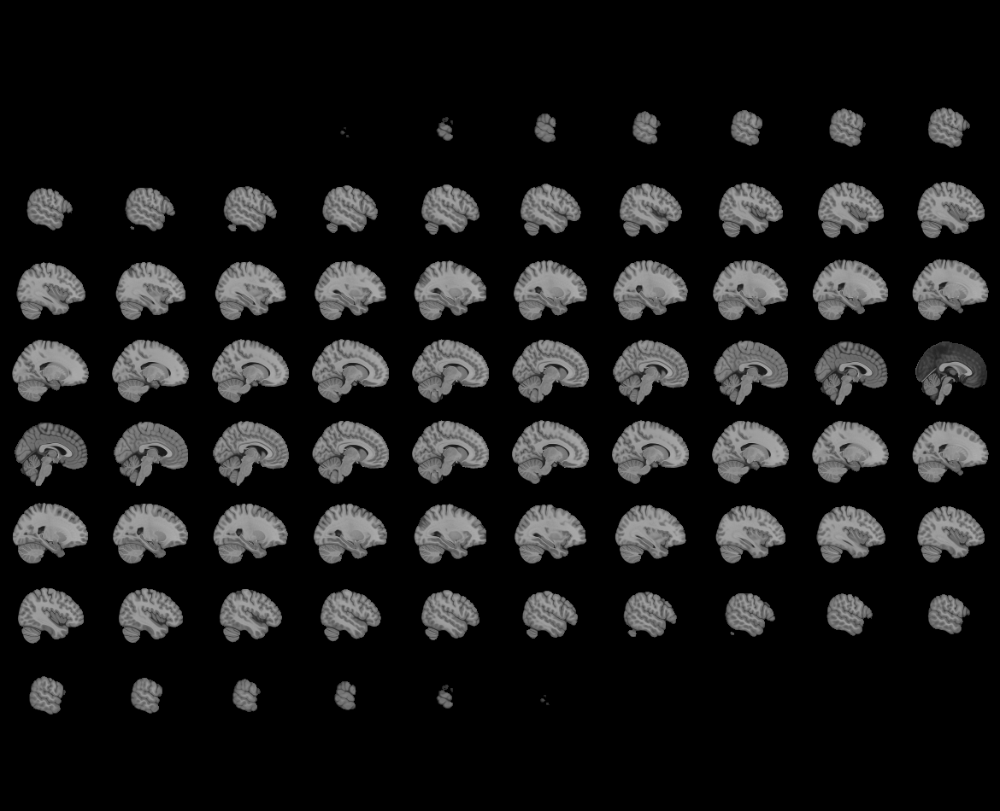
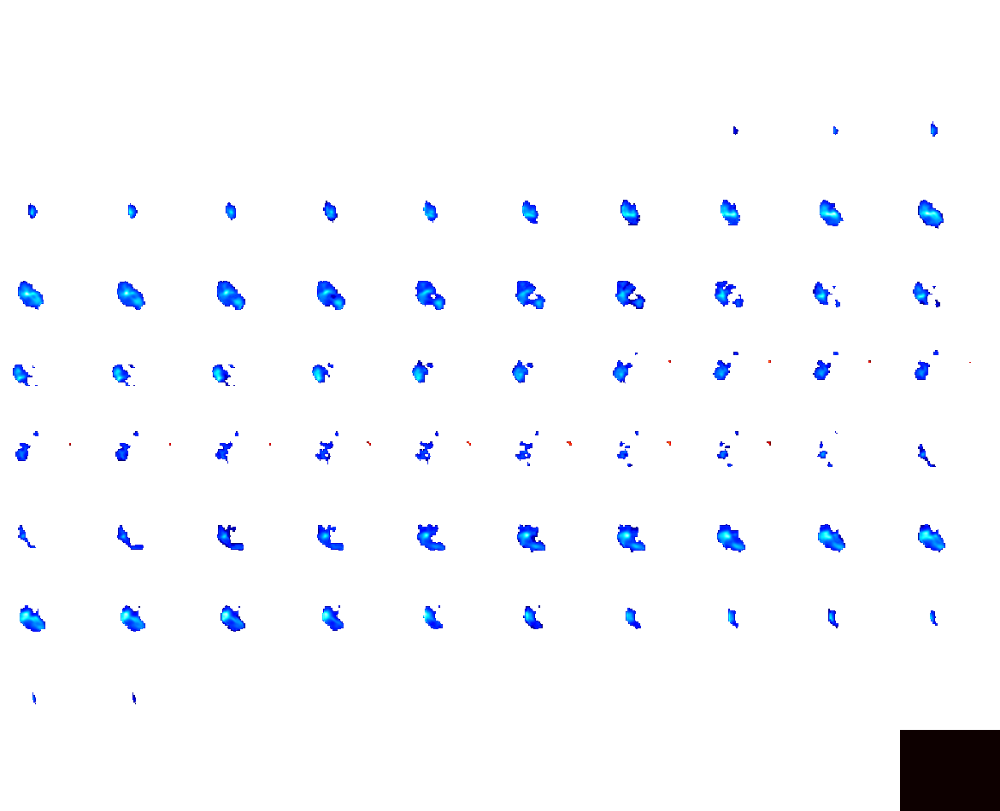

In [66]:
i = 1
view = plot_t_values_in_brain(t_values_list[i], significant_indices_list[i], f'{variable_names[i]}', tmp_img)
view

c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_stat_map.py:198: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\numpy\core\fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_document.py:102: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn(



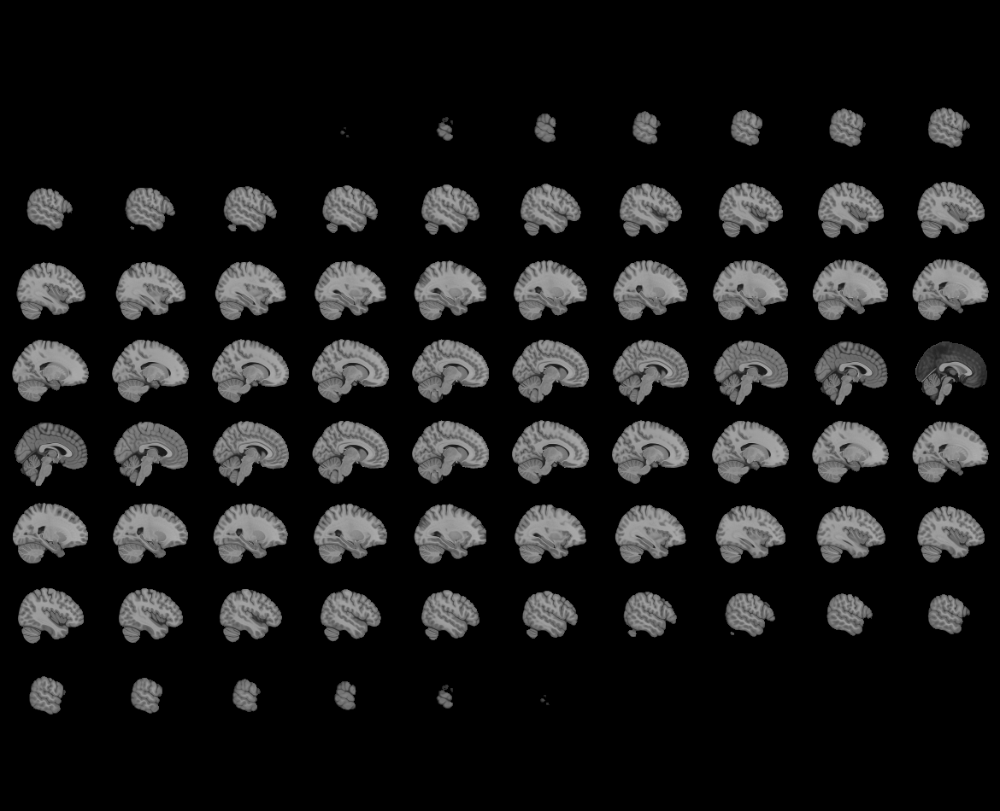
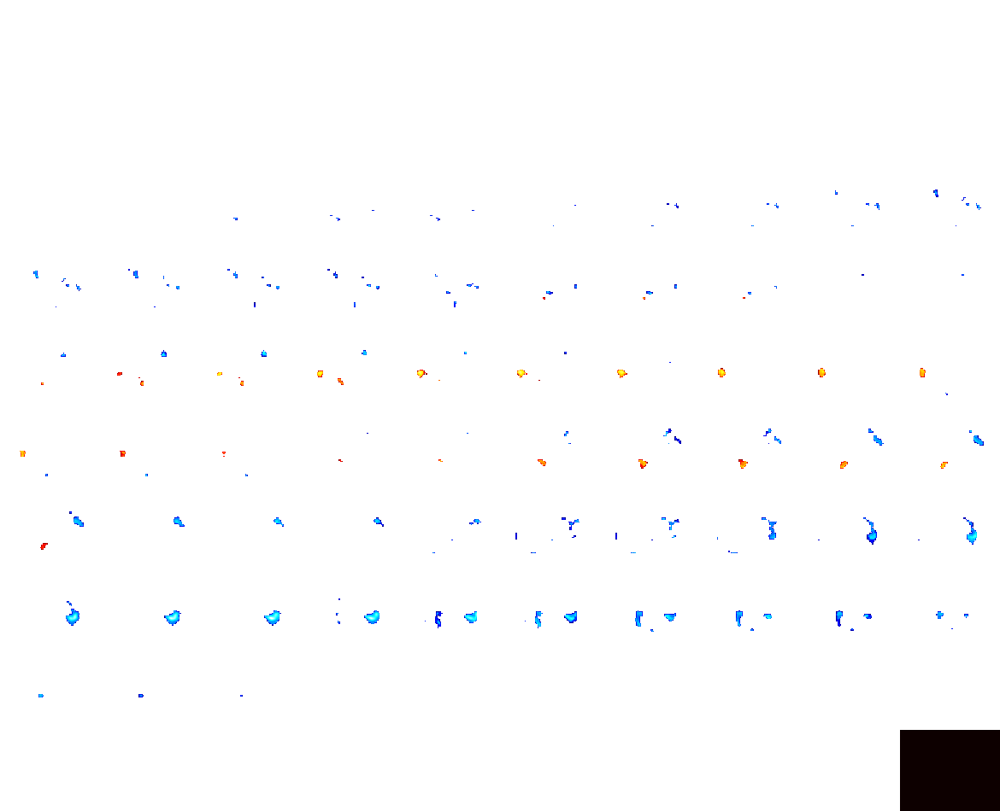

In [67]:
i = 2
view = plot_t_values_in_brain(t_values_list[i], significant_indices_list[i], f'{variable_names[i]}', tmp_img)
view

c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_stat_map.py:198: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\numpy\core\fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_document.py:102: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn(



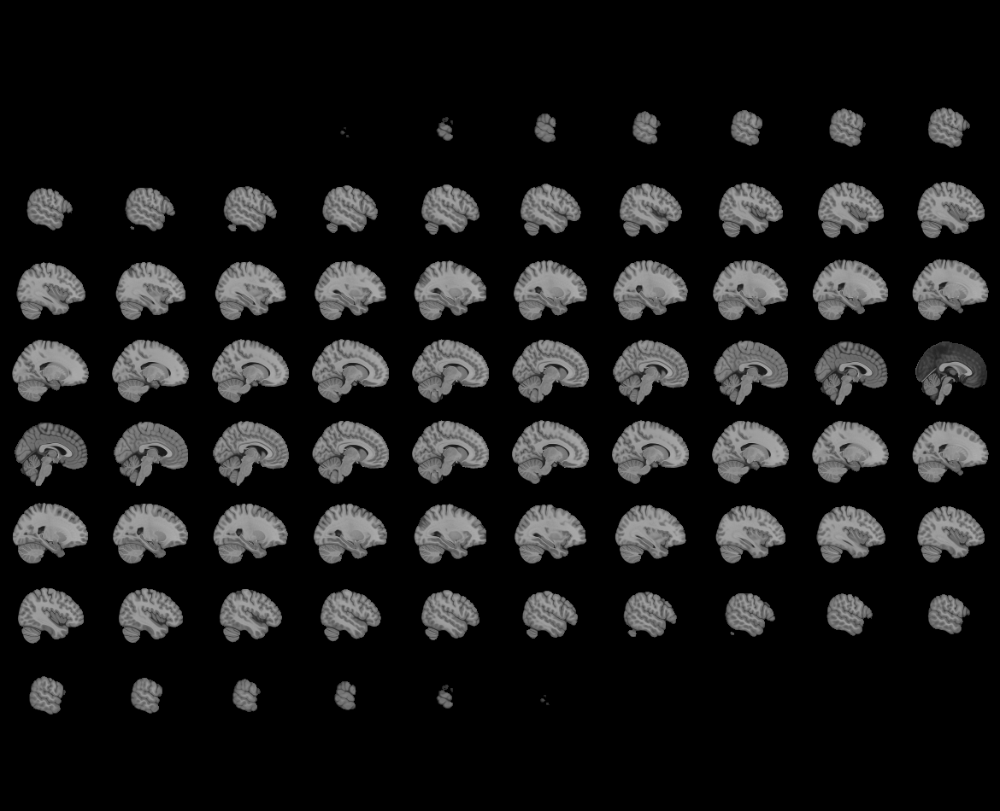
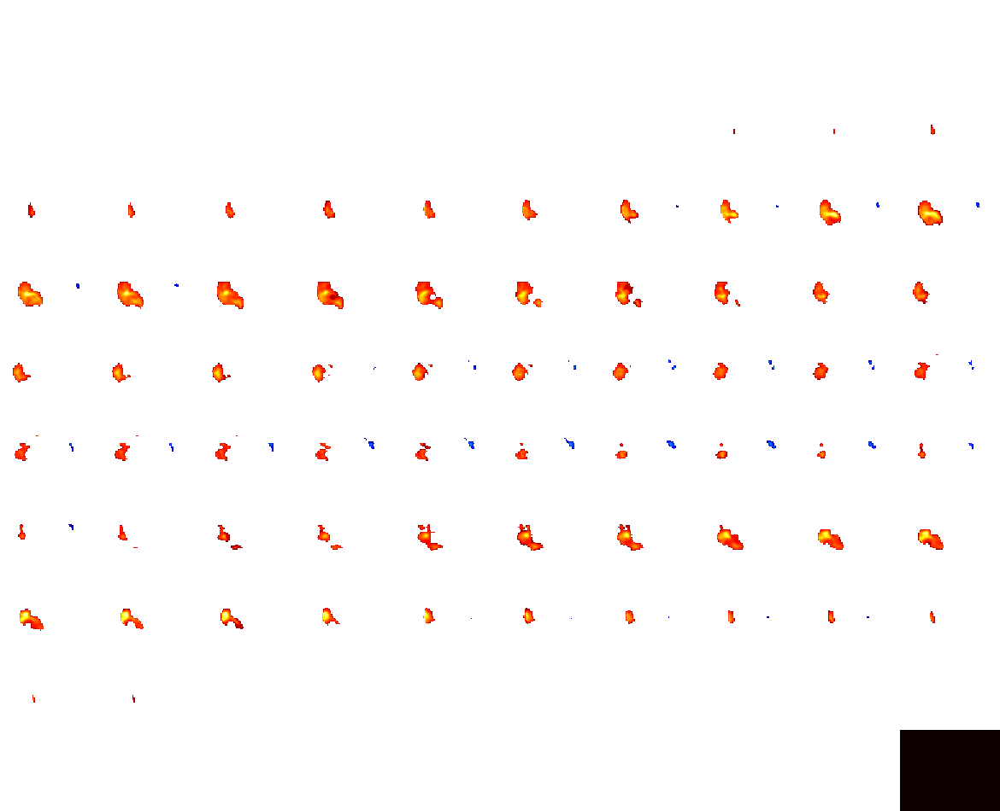

In [68]:
i = 3
view = plot_t_values_in_brain(t_values_list[i], significant_indices_list[i], f'{variable_names[i]}', tmp_img)
view

c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_stat_map.py:198: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\numpy\core\fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_document.py:102: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn(



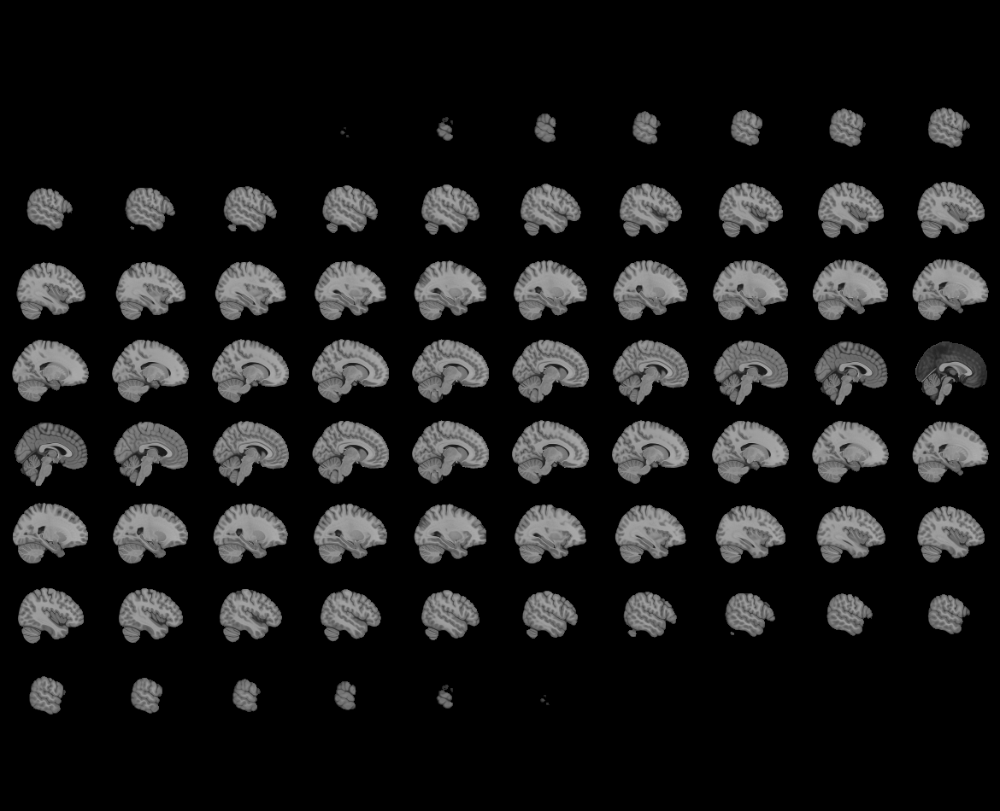
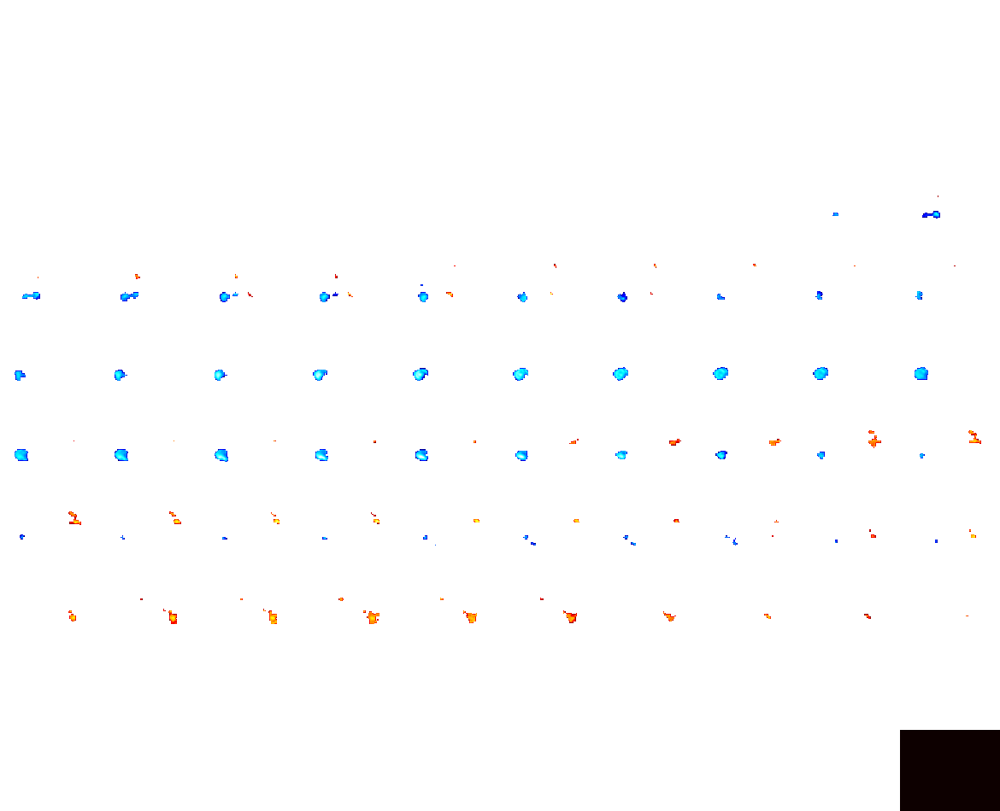

In [69]:
i = 4
view = plot_t_values_in_brain(t_values_list[i], significant_indices_list[i], f'{variable_names[i]}', tmp_img)
view

# Searchlight only with VA

In [75]:
import numpy as np
from sklearn.linear_model import LinearRegression
from rsatoolbox.util.searchlight import get_searchlight_RDMs

def upper_tri(RDM):
    """upper_tri returns the upper triangular index of an RDM"""
    m = RDM.shape[0]
    r, c = np.triu_indices(m, 1)
    return RDM[r, c]

def fit_glm_to_rdm(neural_rdm_flat, rdm_behavioral_flat):
    # Use the flattened RDMs directly
    y = neural_rdm_flat  # Neural RDM is already flattened
    
    # Use only the behavioral RDM as the predictor
    X = rdm_behavioral_flat.reshape(-1, 1)  # Reshape to 2D array for sklearn
    
    # Fit the GLM model using linear regression
    glm = LinearRegression().fit(X, y)
    
    # Return the regression coefficients (betas)
    return glm.coef_

def searchlight_analysis(allsub_avg, centers, neighbors, rdm_behavioral):
    n_subjects = allsub_avg.shape[0]
    eval_score_list = []

    # Flatten the RDM
    rdm_behavioral_flat = upper_tri(rdm_behavioral)
    
    for i in range(n_subjects):
        subj_data = allsub_avg[i]  # Get data for subject i
        
        # Generate searchlight RDMs for this subject
        subj_data_2d = np.nan_to_num(subj_data)

        image_value = np.arange(60)
        SL_RDMs = get_searchlight_RDMs(subj_data_2d, centers, neighbors, image_value, method='correlation')

        # The RDMs object contains several RDM matrices, let's extract them
        for idx, rdm in enumerate(SL_RDMs):
            # Extract the RDM corresponding to the voxel center at index 'idx'
            rdm_neural_flat = rdm.dissimilarities.flatten()  # Use the flattened dissimilarities
         
            # Fit GLM to the neural RDM at this center
            betas = fit_glm_to_rdm(rdm_neural_flat, rdm_behavioral_flat)
            
            # Store the results (can be further processed or averaged over subjects)
            eval_score_list.append((centers[idx], betas))
    
    return eval_score_list

In [76]:
eval_score_list = searchlight_analysis(allsub_avg, centers, neighbors, rdm_behavioral)

Calculating RDMs...:   0%|          | 0/100 [00:00<?, ?it/s]

Calculating RDMs...: 100%|██████████| 100/100 [03:44<00:00,  2.25s/it]


In [77]:
n_subjects = 20
n_voxel_centers = len(eval_score_list) // n_subjects

# Extract betas for the behavioral RDM and reshape
betas_behavioral = np.array([betas[0] for _, betas in eval_score_list]).reshape(n_subjects, n_voxel_centers)

# Perform t-tests across subjects for the behavioral RDM
t_values_behavioral, p_values_behavioral = stats.ttest_1samp(betas_behavioral, 0, axis=0)

# Apply FDR correction
_, p_values_behavioral_fdr = fdrcorrection(p_values_behavioral, alpha=0.05)

# Select significant voxel centers
significant_behavioral = p_values_behavioral_fdr < 0.01

# Store t-values and significant indices in lists
t_values_list = [t_values_behavioral]
significant_indices_list = [significant_behavioral]

# List of independent variable names
variable_names = ["Behavioral"]

# Print the number of significant voxel centers for the behavioral RDM
for name, significant in zip(variable_names, significant_indices_list):
    print(f"Significant {name} voxel centers: {np.sum(significant)}")

Significant Behavioral voxel centers: 538


## Plotting

In [78]:
# Dimensions of the voxel space
x, y, z = 53, 63, 46  # Adjust these dimensions to match your data

# Extract unique voxel indices from the first subject's data
n_subjects = 20
voxel_indices = np.array([center for center, _ in eval_score_list[:len(eval_score_list) // n_subjects]])

# Function to map t-values to voxel space and plot
def plot_t_values_in_brain(t_values, significant_mask, title, tmp_img):
    # Initialize an array for the t-statistics in 3D space
    t_stat_sig = np.full((x * y * z), np.nan)
    
    # Map significant t-values to their voxel indices
    significant_voxel_indices = voxel_indices[significant_mask]
    t_stat_sig[significant_voxel_indices] = t_values[significant_mask]
    
    # Reshape the 1D t-statistics array into a 3D array matching the voxel space
    t_stat_sig_3d = t_stat_sig.reshape([x, y, z])
    
    # Create a new image object from the 3D t-statistics
    t_stat_sig_img = new_img_like(tmp_img, t_stat_sig_3d)
    
    # View the image
    view = plotting.view_img(t_stat_sig_img, title=title)
    return view

c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_stat_map.py:198: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\numpy\core\fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro_local\lib\site-packages\nilearn\plotting\html_document.py:102: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn(



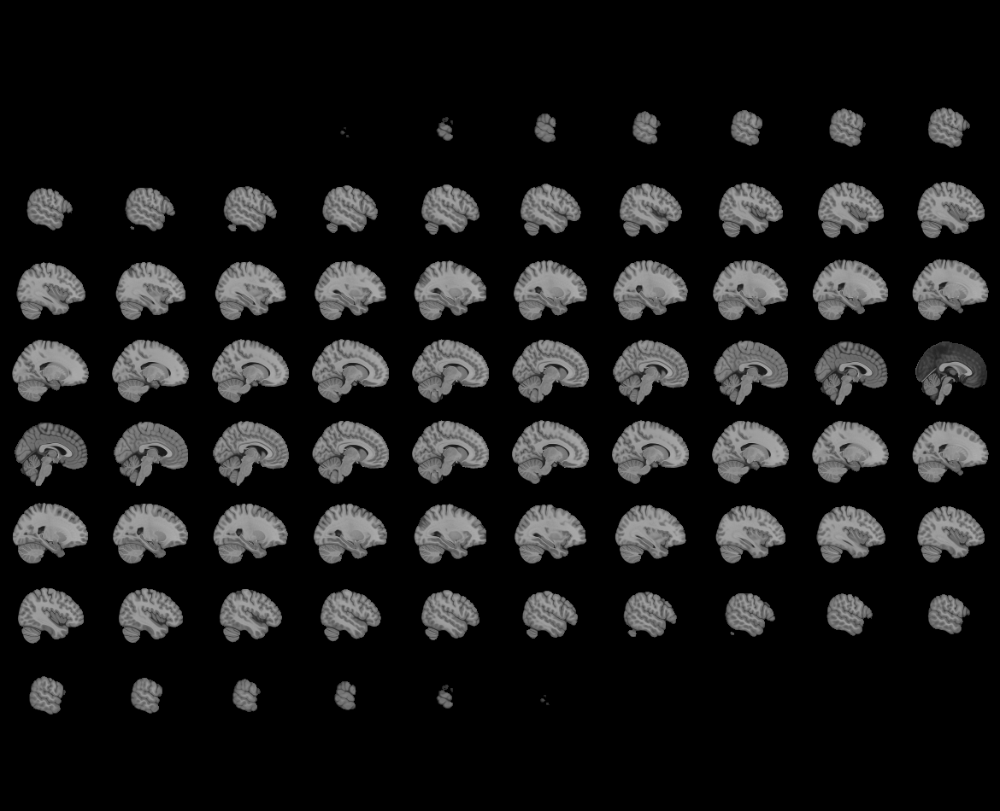
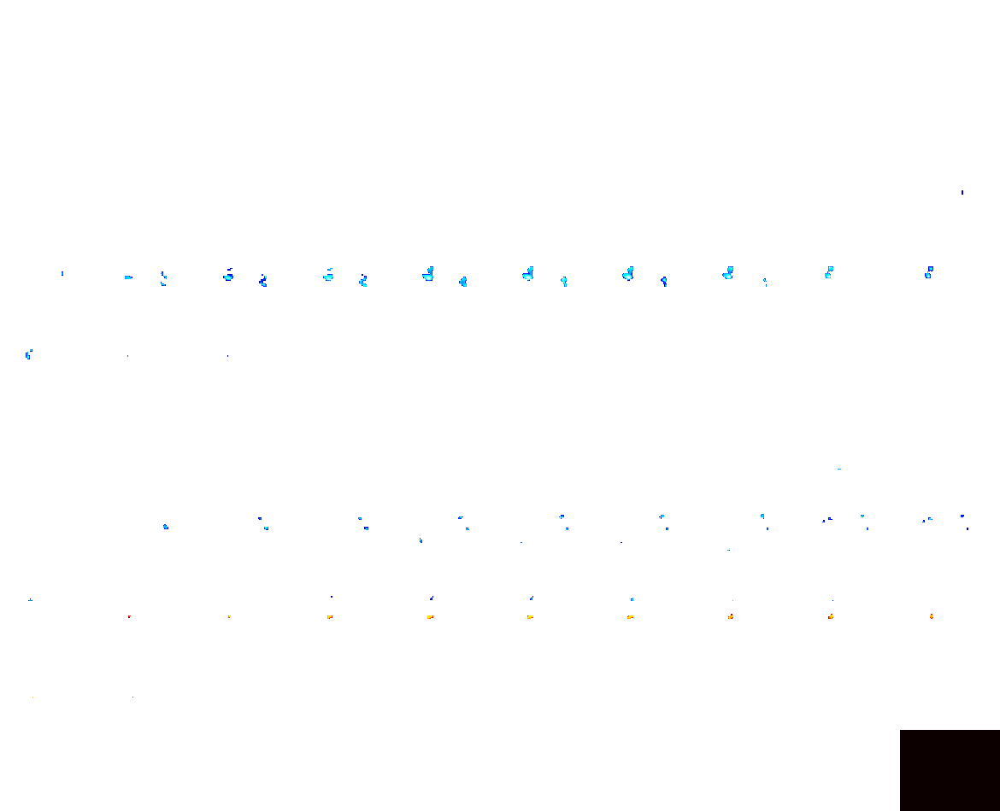

In [79]:
i = 0
view = plot_t_values_in_brain(t_values_list[i], significant_indices_list[i], f'{variable_names[i]}', tmp_img)
view